In [95]:
#GIS analysis and data processing algorithm for energy transport systems

#This code aims to provide an universally applicable algorithm for vertical and horizontal aggregation

#Horizontal integration 
# -	Automatically connect any nodes with one another without crossing. (Delaunay Triangulation) - Delaunay tessellation in N dimensions.
# -	Differentiation between land and sea connections. Can we give nodes a condition that if they are close to a coast (e.g. <10km) they act as harbours and can serve connections from land and sea? What if there is just one central node in each country? Can we say at least the node closest to the coast in each country with a sea border needs to contain the harbour property? What if one country connects two different oceans? (e.g. USA?)
# -	Not to many unnecessary connection (e.g. connections that run very close to each other)
# -	Pipeline factor
# -	Waterborne transport around land masses
# - making sure that every point is somehow connected with every other point to ensure feasibility

#Vertical integration
# -	Nodal mismatch
# -	Nodal merging
# - Combination with renewable energy potential geodata

# Backlog for next versions

# - investment modelling
# - toggling regions before clustering
# - integrate Gas grid GGM
# - consideration of storage when crossing countries

# Troubleshooting notes

# - defining candidate connections for pipeline invest
# - focusing on relevant problem at hand - distance between nodes

In [96]:
import geopandas as gpd
import os
from shapely.geometry import Point, Polygon, LineString, MultiPoint
from shapely.ops import triangulate
import pandas as pd
import searoute as sr
from matplotlib import pyplot as plt
import numpy as np
from itertools import combinations
from scipy.spatial import Delaunay
import random

In [97]:
#import geopandas included shapefiles
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
capitalcities = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))

#import external datasets, these datasets are currently for visualisation purposes only and are not necessary for the code to work
data_pth_input = "../data/data_input/" #define dataset source folder
cities = gpd.read_file(os.path.join(data_pth_input, "cities/ne_10m_populated_places.shp"))
ports = gpd.read_file(os.path.join(data_pth_input, "ports/WPI.shp"))
rivers = gpd.read_file(os.path.join(data_pth_input, "rivers/world_rivers.shp"))
deepsea = gpd.read_file(os.path.join(data_pth_input, "bm_world_3000mdepth/bm_world_3000mdepthres1.shp"))

#data path definition for export files
data_pth_output = "../data/data_output/"

#define model results source folder
data_pth_model_results = "../model/.spinetoolbox/items/spineopttotable_xlsx/output/"

#define data results folder
data_pth_results = "../data/data_results/"

In [98]:
# create an empty input datasheet template to fill in the nodes for your transport model

nodes_datasheet_temp = pd.DataFrame(columns=("name", "class", "attribute1", "value1", "attribute2", "value2", "h2_demand", "balance_type", "connection_investment_cost_onshore", "connection_investment_lifetime", "fix_ratio_out_in_connection_flow", "connection_flow_cost", "WACC", "ship_investment_cost", "fuel_costs", "fuel_consumption"))

nodes_datasheet_temp.to_excel(os.path.join(data_pth_input, "nodes/nodes_and_parameters_template.xlsx"), index=False, sheet_name="nodes") #to be used in the script delete the ending "_template"

nodes_datasheet_temp

,name,class,attribute1,value1,attribute2,value2,h2_demand,balance_type,connection_investment_cost_onshore,connection_investment_lifetime,fix_ratio_out_in_connection_flow,connection_flow_cost,WACC,ship_investment_cost,fuel_costs,fuel_consumption


In [99]:
#Centrally define default model parameters

con_flow_cost = 2           #connection flow costs
node_slack_pen = 10000000000    #slack penalty cost
con_cap_pipelines = 10000000000    #pipeline connection capacity
con_cap_ships = 10000000    #ship connection capacity
fix_ratio_io = 0.95            #default transmission losses
default_WACC = 0.06                    #default WACCC
lifetime = 20               #default lifetime
default_invest = 1000       #€/km/MW Pipeline default invest
bts = 0.85                   #share of nodes with balance_type_node
connection_investment_cost = 100
connection_investment_lifetime = "{\"type\": \"duration\", \"data\": \"2D\"}"
time_share = 48/8760        #value that represents the share of connection investment lifetime from a year to be able to scale the investment costs to the investment period
candidate_connections = 1
connection_flow_cost = 1
ship_speed = 16*1.852       #in km/h equals 13kn
pipeline_elongation_factor = 1.3 #factor by which the length of the pipelines are multiplied to account for non-direct connection between nodes.
h2_pipelines_offshore_factor = 1.7 #factor for cost increasing through subsea pipelines
alternative = "20230728_13_30"

In [100]:
#Randomizing functions

#Randomizing function to create an array of random numbers as long as a given dataframe "trans_nodes" and multiply the value by a certain multiplicator "multi" (default = 0 < value < 1)
def randomize(trans_nodes, multi):
    random_nr = []
    rdnr = float
    for ind in trans_nodes.index:
        rdnr = random.random()*multi
        random_nr.append(rdnr)
    return random_nr

#Randomizing function to create an array of a certain number of random number "anzahl" and multiply the value by a certain multiplicator "multi" (default = 0 < value < 1)
def randomize1(anzahl, multi):
    random_nr = []
    rdnr = float
    for i in range(0, anzahl):
        rdnr = random.random()*multi
        random_nr.append(rdnr)
    return random_nr


In [101]:
#Dieser Teil im Script ist neu und ermöglicht es flexibler die Knotenpunkte anzupassen (alles bis auf Europa und wenige andere Staaten raus und dann einzelne Bundesländer für Deutschland)
#mit diesem Skript werden aus der Liste aus der neues nodes Datei die einzelnen nodes in ein dataframe geschrieben und die Koordinaten in ein funktionierendes geometry Objekt verpackt.
new_nodes = pd.read_excel(os.path.join(data_pth_input, "nodes/nodes_and_parameters_v2.xlsx"), sheet_name=0) #einlesen der xlsx in ein dataframe
#new_nodes = pd.read_excel(os.path.join(data_pth_input, "nodes/nodes_and_parameters_presentation.xlsx"), sheet_name=0) #einlesen der xlsx in ein dataframe alternative nodeset for presentations
new_nodes = new_nodes.rename(columns={"attribute.1":"attribute_"})
new_nodes = new_nodes[["name", "value1", "value2", "h2_demand_gross", "h2_demand_net", "max_h2_pot", "balance_type", "connection_investment_cost", "connection_investment_lifetime",
                       "fix_ratio_out_in_connection_flow", "connection_fom_cost", "WACC", "tax_net_unit_flow", "max_h2_prod"]]

new_nodes_points = new_nodes.apply(lambda row: Point(row.value1, row.value2), axis=1) #axis=1 macht, dass es von Reihe zu Reihe geht und nicht von Spalte zu Spalte
#first lon then lat
new_nodes_points.head() #hier sind dann die geometry informationen drinne

new_nodes = gpd.GeoDataFrame(new_nodes, geometry=new_nodes_points) #hier werden die geo infos in die neue Spalte geometry im geodataframe eingefügt
new_nodes.crs = {"init": "epsg:4326"} #anpassan der Projektion

new_nodes = new_nodes.rename(columns={"value1":"x", "value2":"y", "h2_demand_net":"h2_demand"})      #renaming coordinate columns
new_nodes["y"] = new_nodes["y"]*(-1)                                    #transforming latitude values to match Spine GUI requirement - can be left out for other frameworks
new_nodes["h2_node"] = new_nodes['name'] + "_h2"                        #defining name for hydrogen nodes

new_nodes["balance_type"] = "balance_type_node"

for g in new_nodes.index:
    if new_nodes.loc[g, "tax_net_unit_flow"] <=  52:
        new_nodes.loc[g, "has_state"] = "true"
        new_nodes.loc[g, "initial_node_state"] = new_nodes.loc[g, "max_h2_pot"]*5   #2 times because of the 2 timesteps that need to be supplied
        new_nodes.loc[g, "node_state_cap"] = new_nodes.loc[g, "max_h2_pot"]*5
        new_nodes.loc[g, "node_state_coeff"] = 1
    else:
        new_nodes.loc[g, "has_state"] = "false"
        #new_nodes.loc[g, "initial_node_state"] = 0
        #new_nodes.loc[g, "node_state_cap"] = 0

# #Defining random source nodes (balance type none or node). This function is deactivated because the balance_type is now defined by the national strategies whether the respective country wants to export/import
# bal_ty = []
# for c in new_nodes.index:
#     if random.random() < bts:
#         bal_ty.append("balance_type_node")
#     else:
#         bal_ty.append("balance_type_none")
#new_nodes["balance_type"] = bal_ty

new_nodes["node_slack_penalty"] = node_slack_pen

new_nodes.tail(50)
#plexos_nodes = new_nodes

c:\Users\oliver\mambaforge\envs\geo_tools\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,name,x,y,h2_demand_gross,h2_demand,max_h2_pot,balance_type,connection_investment_cost,connection_investment_lifetime,fix_ratio_out_in_connection_flow,...,WACC,tax_net_unit_flow,max_h2_prod,geometry,h2_node,has_state,initial_node_state,node_state_cap,node_state_coeff,node_slack_penalty
211,NA-USA-ER,-98.899120,-30.568468,82513.093163,67632.593256,6.007503e+05,balance_type_node,174120.334622,40,0.98,...,0.05,60.066007,14880.499907,POINT (-98.89912 30.56847),NA-USA-ER_h2,false,NaN,NaN,NaN,10000000000
212,NA-USA-FR,-81.514371,-28.136333,52137.316971,42734.817191,3.795944e+05,balance_type_node,174120.334622,40,0.98,...,0.05,65.526553,9402.499781,POINT (-81.51437 28.13633),NA-USA-FR_h2,false,NaN,NaN,NaN,10000000000
213,NA-USA-GU,144.757551,-13.450126,341.844309,280.195739,2.488855e+03,balance_type_node,174120.334622,40,0.98,...,0.05,68.256826,61.648570,POINT (144.75755 13.45013),NA-USA-GU_h2,false,NaN,NaN,NaN,10000000000
214,NA-USA-HA,-155.524040,-19.644864,1965.786282,1611.274271,1.431224e+04,balance_type_node,174120.334622,40,0.98,...,0.05,54.605461,354.512011,POINT (-155.52404 19.64486),NA-USA-HA_h2,false,NaN,NaN,NaN,10000000000
215,NA-USA-ME,-88.958725,-44.501402,5273.433370,4322.416728,3.839411e+04,balance_type_node,174120.334622,40,0.98,...,0.05,70.987099,951.016642,POINT (-88.95872 44.50140),NA-USA-ME_h2,false,NaN,NaN,NaN,10000000000
216,NA-USA-MW,-96.868195,-45.166061,45369.075336,37187.167527,3.303171e+05,balance_type_node,174120.334622,40,0.98,...,0.05,62.796280,8181.907810,POINT (-96.86820 45.16606),NA-USA-MW_h2,false,NaN,NaN,NaN,10000000000
217,NA-USA-NE,-70.942480,-43.388456,28990.989187,23762.723037,2.110737e+05,balance_type_node,174120.334622,40,0.98,...,0.05,65.526553,5228.266150,POINT (-70.94248 43.38846),NA-USA-NE_h2,false,NaN,NaN,NaN,10000000000
218,NA-USA-NW,-114.018431,-43.034781,55225.819919,45266.336197,4.020808e+05,balance_type_node,174120.334622,40,0.98,...,0.05,51.875188,9959.483722,POINT (-114.01843 43.03478),NA-USA-NW_h2,true,2.010404e+06,2.010404e+06,1.0,10000000000
219,NA-USA-NY,-74.825557,-42.763900,36162.180429,29640.653943,2.632848e+05,balance_type_node,174120.334622,40,0.98,...,0.05,70.987099,6521.526486,POINT (-74.82556 42.76390),NA-USA-NY_h2,false,NaN,NaN,NaN,10000000000
220,NA-USA-PR,-66.413282,-18.221417,3822.413467,3133.075314,2.782972e+04,balance_type_node,174120.334622,40,0.98,...,0.05,60.066007,689.338153,POINT (-66.41328 18.22142),NA-USA-PR_h2,false,NaN,NaN,NaN,10000000000


In [102]:
# #randomly generated time series - currently not needed

# def produce_time_series(input_df, ts_name):
#     transfer = input_df
#     zeitreihe = []
#     zeitreihe_str = []
#     monate = ["2015-01-01T00:00:00","2015-02-01T00:00:00","2015-03-01T00:00:00", "2015-04-01T00:00:00", "2015-05-01T00:00:00", "2015-06-01T00:00:00", "2015-07-01T00:00:00", "2015-08-01T00:00:00", "2015-09-01T00:00:00", "2015-10-01T00:00:00", "2015-11-01T00:00:00", "2015-12-01T00:00:00"]
    
#     df_min = randomize1(12, 100)

#     for i in transfer.index:
#         zeitreihe = zeitreihe + ['']            #Platzhalterliste
#         zeitreihe_str = zeitreihe_str + ['']    #Platzhalterliste
#     for j in range(len(transfer)):              #Schleife zum einlesen des Zuflusses ALLER Nodes zu jeweils einer Zeitreihe
#         for i in range(len(monate)-1):          #Schleife zum einlesen des Zuflusses EINES Nodes zu seiner Zeitreihe
#             zeitreihe[j] = zeitreihe[j] + '"' + monate[i] + '": ' + """str(df_min[i])""" + ', '   #min_flow von Monat i, in der Region j
#         zeitreihe[j] = zeitreihe[j].removesuffix(', ')
#         zeitreihe_str[j] = '{"type": "time_series", "data": {' + zeitreihe[j] + '}}'

#     transfer[ts_name] = zeitreihe_str
#     #transfer.cf_timeseries[0]
#     return transfer

# test_df = produce_time_series(new_nodes, "el_demand_ts")
# test_df = produce_time_series(new_nodes, "h2_demand_ts")

In [103]:
#Defining global regions

values = ["Canada", "United States of America", "Greenland"]
north_america = world.loc[world['name'].isin(values)]
values = ["Mexico", "Belize", "Guatemala", "Panama", "Nicaragua", "Costa Rica", "San Jose", "El Salvador", "Honduras"]
central_america = world.loc[world['name'].isin(values)]
values = ["Cuba", "Bahamas", "Trinidad and Tobago", "Haiti", "Dominican Rep.", "Antigua and Barbuda", "Barbados", "Jamaica", "Puerto Rico"]
caribbean = world.loc[world['name'].isin(values)]
values = ["Colombia", "Venezuela", "Guyana", "Suriname", "Brazil", "Argentina", "Uruguay", "Paraguay", "Bolivia", "Falkland Is."]
east_coast_south_america = world.loc[world['name'].isin(values)]
values = ["Ecuador", "Peru", "Chile"]
west_coast_south_america = world.loc[world['name'].isin(values)]
values = ["Norway", "Sweden", "Finland", "Lithuania", "Estonia", "Latvia", "United Kingdom", "Ireland", "Iceland", "Denmark"]
northern_europe = world.loc[world['name'].isin(values)]
values = ["Germany", "Netherlands", "Belgium", "France", "Austria", "Switzerland", "Luxembourg", "Liechtenstein"]
central_europe = world.loc[world['name'].isin(values)]
values = ["Spain", "Portugal", "Italy", "Greece", "Croatia", "Serbia", "Albania", "Montenegro", "Kosovo", "North Macedonia", "Slovenia","Andorra", "Bosnia and Herz.", "Cyprus", "N. Cyprus"]
southern_europe = world.loc[world['name'].isin(values)]
values = ["Poland", "Czechia", "Slovakia", "Hungary", "Romania", "Ukraine", "Moldova", "Bulgaria"]
eastern_europe = world.loc[world['name'].isin(values)]
values = ["Russia", "Belarus"]
russia_belarus = world.loc[world['name'].isin(values)]
values = ["Morocco", "Tunisia", "Egypt", "Algeria", "Libya"]
northern_africa = world.loc[world['name'].isin(values)]
values = ["Chad", "Sudan", "S. Sudan", "Central African Rep.", "Mali", "Niger", "Mauritania", "W. Sahara"]
sahel_zone = world.loc[world['name'].isin(values)]
values = ["Ghana", "Senegal", "Guinea", "Nigeria", "Togo", "Benin", "Burkina Faso", "Côte d'Ivoire", "Sierra Leone", "Liberia", "Gambia", "Guinea-Bissau"]
north_west_coast_africa = world.loc[world['name'].isin(values)]
values = ["Eritrea", "Somalia", "Somaliland", "Ethiopia", "Tanzania", "Kenya","Mozambique", "Madagascar", "Djibouti"]
east_coast_africa = world.loc[world['name'].isin(values)]
values = ["Dem. Rep. Congo", "Gambia", "Botswana", "Burundi", "Rwanda", "Uganda", "Malawi", "Zimbabwe", "Zambia"]
south_central_africa = world.loc[world['name'].isin(values)]
values = ["Angola", "Cameroon", "Congo", "Eq. Guinea", "Gabon"]
west_coast_africa = world.loc[world['name'].isin(values)]
values = ["South Africa", "Namibia", "eSwatini", "Lesotho"]
southern_africa = world.loc[world['name'].isin(values)]
values = ["Iraq", "Syria", "Israel", "Palestine", "Lebanon", "Jordan", "Saudi Arabia", "United Arab Emirates", "Qatar", "Turkey", "Armenia", "Georgia", "Azerbaijan", "Bahrain", "Oman", "Yemen", "Azerbaijan", "Kuwait"]
middle_east = world.loc[world['name'].isin(values)]
values = ["Uzbekistan", "Tajikistan", "Kazakhstan", "Turkmenistan", "Kyrgyzstan"]
central_asia = world.loc[world['name'].isin(values)]
values = ["India", "Afghanistan", "Pakistan", "Iran", "Bangladesh", "Bhutan", "Nepal", "Sri Lanka"]
southern_asia = world.loc[world['name'].isin(values)]
values = ["China", "Japan", "North Korea", "South Korea", "Mongolia", "Taiwan"]
eastern_asia = world.loc[world['name'].isin(values)]
values = ["Indonesia", "Singapore", "Thailand", "Vietnam", "Laos", "Myanmar", "Brunei", "Cambodia", "Malaysia", "Philippines", "Timor-Leste"]
south_eastern_asia = world.loc[world['name'].isin(values)]
values = ["Australia","New Zealand", "Fji", "New Caledonia", "Papua New Guinea", "Solomon Is.", "Vanuatu"]
australia_oceania = world.loc[world['name'].isin(values)]

In [104]:
world_cost = gpd.sjoin(world, new_nodes, how="inner", predicate="intersects")
world_cost = gpd.GeoDataFrame(world_cost, geometry=world_cost["geometry"], crs="EPSG:4326")

world_cost

C:\Users\oliver\AppData\Local\Temp\ipykernel_13600\449586497.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: +init=epsg:4326 +type=crs

  world_cost = gpd.sjoin(world, new_nodes, how="inner", predicate="intersects")


,pop_est,continent,name_left,iso_a3,gdp_md_est,geometry,index_right,name_right,x,y,...,connection_fom_cost,WACC,tax_net_unit_flow,max_h2_prod,h2_node,has_state,initial_node_state,node_state_cap,node_state_coeff,node_slack_penalty
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",239,OC-FJI,179.414413,16.578193,...,NaN,0.05,54.605461,306.527506,OC-FJI_h2,false,NaN,NaN,NaN,10000000000
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",46,AF-TZA,34.888822,6.369028,...,NaN,0.05,54.605461,472.259194,AF-TZA_h2,false,NaN,NaN,NaN,10000000000
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",15,AF-ESH,-12.885834,-24.215527,...,NaN,0.05,49.144914,6.316523,AF-ESH_h2,true,2781.928761,2781.928761,1.0,10000000000
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",188,NA-CAN-AR,-64.903434,-46.001723,...,NaN,0.05,79.177918,1987.075000,NA-CAN-AR_h2,false,NaN,NaN,NaN,10000000000
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",193,NA-CAN-ON,-84.882396,-49.767539,...,NaN,0.05,90.099010,10204.448528,NA-CAN-ON_h2,false,NaN,NaN,NaN,10000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,2083459.0,Europe,North Macedonia,MKD,12547,"POLYGON ((22.38053 42.32026, 22.88137 41.99930...",173,EU-MKD,21.745275,-41.608635,...,NaN,0.05,70.987099,22.039657,EU-MKD_h2,false,NaN,NaN,NaN,10000000000
172,6944975.0,Europe,Serbia,SRB,51475,"POLYGON ((18.82982 45.90887, 18.82984 45.90888...",181,EU-SRB,21.005859,-44.016521,...,NaN,0.05,73.717372,100.149368,EU-SRB_h2,false,NaN,NaN,NaN,10000000000
173,622137.0,Europe,Montenegro,MNE,5542,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",175,EU-MNE,19.374390,-42.708678,...,NaN,0.05,70.987099,9.224703,EU-MNE_h2,false,NaN,NaN,NaN,10000000000
174,1794248.0,Europe,Kosovo,-99,7926,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",168,EU-KOS,20.902977,-42.602636,...,NaN,0.05,70.987099,14.958537,EU-KOS_h2,false,NaN,NaN,NaN,10000000000


In [105]:
#Transforming Shapely Points to Numpy Array and triangulating it

tri_work_points = new_nodes["geometry"].copy()

listarray = []
for pp in tri_work_points:
    listarray.append([pp.x, pp.y])
tri_work_array = np.array(listarray)

plexos_nodes_triangulation = Delaunay(tri_work_array)

# Now I have one shapefile with building polygons. I would like to convert them into lines split at each vertex, keeping the original source info as an attribute (Name).
# Use .boundary method to convert the polygons to lines, and .coords to fetch the coordinates of each line segment. Then .explode:
# https://gis.stackexchange.com/questions/436679/how-to-convert-polygons-to-line-segments-using-python

coord_groups = [plexos_nodes_triangulation.points[x] for x in plexos_nodes_triangulation.simplices] #plexos_nodes_triangulation ist eine Variable von weiter oben die die Dreiecke der Delaunay Triangulation beinahtlet und hier in ein gpd Polygon umgebaut wird.
polygons = [Polygon(x) for x in coord_groups]

df = gpd.GeoDataFrame(columns=["geometry"])     #the polygon file is a list array which is now defined as "geometry" attribute of the gdf
df["geometry"] = polygons
df["geometry"] = df.geometry.boundary
dfline = gpd.GeoDataFrame(data=df, geometry='geometry')

def explodeLine(row):
    """A function to return all segments of a line as a list of linestrings"""
    coords = row.geometry.coords #Create a list of all line node coordinates
    parts = []
    for part in zip(coords, coords[1:]): #For each start and end coordinate pair
        parts.append(LineString(part)) #Create a linestring and append to parts list
    return parts

dfline["tempgeom"] = dfline.apply(lambda x: explodeLine(x), axis=1)     #Create a list of all line segments explodeLine(dfline)
dfline = dfline.explode("tempgeom")                                     #Explode it so each segment becomes a row (https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.explode.html)

dfline = gpd.GeoDataFrame(data=dfline, geometry='tempgeom')
dfline = dfline.drop('geometry', axis=1)
dfline.crs = df.crs                                                     #apply coordinate system
dfline = dfline.rename_geometry("geometry")

dfline = dfline.reset_index()
dfline = dfline.drop("index", axis=1)
dfline["starts_temp"] = dfline.apply(lambda x: [y for y in x['geometry'].coords[0]], axis=1)
dfline["ends_temp"] = dfline.apply(lambda x: [y for y in x['geometry'].coords[-1]], axis=1)

def retracer(df_retracer, station):
    geo_xy = []
    for ind in dfline.index:
        xy = df_retracer.loc[ind][station]
        slc = Point(xy)
        geo_xy.append(slc)
    return geo_xy

dfline["starts"] = retracer(dfline, "starts_temp")
dfline = dfline.drop("starts_temp", axis=1)
dfline["ends"] = retracer(dfline, "ends_temp")
dfline = dfline.drop("ends_temp", axis=1)

nodes_starts = new_nodes[["h2_node", "geometry", "connection_investment_cost","WACC", "fix_ratio_out_in_connection_flow"]]
nodes_ends = new_nodes[["h2_node", "geometry"]]
nodes_starts = nodes_starts.rename(columns={"h2_node":"h2_node1", "geometry":"starts"})
nodes_ends = nodes_ends.rename(columns={"h2_node":"h2_node2", "geometry":"ends"})
h2_pipelines = dfline.merge(nodes_starts, on="starts", how="left")
h2_pipelines = h2_pipelines.merge(nodes_ends, on="ends", how="left")
h2_pipelines["name"] = h2_pipelines["h2_node1"]+"_"+h2_pipelines["h2_node2"]
h2_pipelines = h2_pipelines.set_geometry("geometry")
h2_pipelines = h2_pipelines.set_crs(4326, allow_override=True)
h2_pipelines = h2_pipelines.drop(columns=["starts","ends"]) #dropping the deepsea pipelines by indexes

# https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoSeries.length.html
h2_pipelines_proj = h2_pipelines.to_crs(crs=3857)    #, allow_override=True)
h2_pipelines_proj["length"] = h2_pipelines_proj.length    #calculating the length of the linestring elements
h2_pipelines["length"] = h2_pipelines_proj.length*pipeline_elongation_factor/1000   #pipeline elongation factor

#dropping the very long pipelines (mostly through the arctic)
#https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoSeries.length.html
h2_pipelines = h2_pipelines.drop(h2_pipelines[h2_pipelines.length >= 80].index)

#dropping all pipelines crossing the deep sea
poly_union = deepsea.geometry.unary_union #combining all deepsea polygons to one multipolygon
subset = gpd.sjoin(h2_pipelines, deepsea, how='inner', predicate='intersects') #pipelines that cross the deepsea
h2_pipelines = h2_pipelines.drop(index = subset.index) #dropping the deepsea pipelines by indexes

#select all pipelines crossing the sea to differentiate land pipelines and sbusea pipelines
h2_pipelines2 = h2_pipelines[["name","geometry"]]
world2 = world[["name","geometry"]]
world2["same"] = 1  #defining one value that is the same in all rows
total_world = world2.dissolve(by='same', aggfunc='sum') #combine country areas to one multipolygon
subset2 = gpd.sjoin(h2_pipelines2, total_world, how='inner', predicate='within') #pipelines that do not cross the sea
subset2 = subset2.drop(columns={"name_right", "index_right"})
subset2 = subset2.rename(columns={"name_left":"name"})
subset2_list = subset2.name
subsea_connections_names_list = subset2_list.values.tolist()
h2_pipelines["shore"] = h2_pipelines_offshore_factor
h2_pipelines.loc[h2_pipelines["name"].isin(subsea_connections_names_list), "shore"] = 1
h2_pipelines["connection_investment_cost"] = h2_pipelines.length*h2_pipelines.connection_investment_cost*h2_pipelines.shore*((1+h2_pipelines.WACC)**lifetime/((1+h2_pipelines.WACC)**lifetime-1))*time_share

h2_pipelines = h2_pipelines.reindex(columns=["name", "h2_node1", "h2_node2", "geometry", "length", "connection_investment_cost", "WACC", "fix_ratio_out_in_connection_flow","shore"])

h2_pipelines["connection_flow_cost"] = con_flow_cost
h2_pipelines["connection_capacity"] = con_cap_pipelines #alt. con_cap_def
h2_pipelines["connection_investment_cost"] = h2_pipelines.length*h2_pipelines.connection_investment_cost*h2_pipelines.shore*((1+h2_pipelines.WACC)**lifetime/((1+h2_pipelines.WACC)**lifetime-1))*time_share
h2_pipelines["connection_investment_variable_type"] = "variable_type_continuous"
h2_pipelines["connection_investment_lifetime"] = connection_investment_lifetime
h2_pipelines["candidate_connections"] = candidate_connections


#new_nodes.head()
#dfline.head(10)
#nodes_comp.head()
h2_pipelines.head(10)
#h2_pipelines_proj.head(20)
#h2_pipelines.length
#nodes_starts

# h2_pipelines[h2_pipelines["name"] == "EU-ISL_h2_EU-NOR_h2"]
# h2_pipelines[h2_pipelines["name"] == "SA-CHL_h2_SA-ARG_h2"]
# h2_pipelines[h2_pipelines["name"] == "AF-EGY_h2_AF-LBY_h2"]

C:\Users\oliver\AppData\Local\Temp\ipykernel_13600\89820133.py:76: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  h2_pipelines = h2_pipelines.drop(h2_pipelines[h2_pipelines.length >= 80].index)
c:\Users\oliver\mambaforge\envs\geo_tools\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\oliver\AppData\Local\Temp\ipykernel_13600\89820133.py:95: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  h2

,name,h2_node1,h2_node2,geometry,length,connection_investment_cost,WACC,fix_ratio_out_in_connection_flow,shore,connection_flow_cost,connection_capacity,connection_investment_variable_type,connection_investment_lifetime,candidate_connections
3,NA-USA-AK_h2_NA-CAN-NO_h2,NA-USA-AK_h2,NA-CAN-NO_h2,"LINESTRING (-149.68091 64.44596, -116.45058 62...",4857.757382,14929.193068,0.05,0.98,1.0,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1
6,EU-FIN_h2_AS-RUS-NW_h2,EU-FIN_h2,AS-RUS-NW_h2,"LINESTRING (25.74815 61.92411, 49.39031 63.56293)",3460.373141,7562.222427,0.05,0.98,1.0,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1
9,AS-RUS-NW_h2_AS-RUS-MV_h2,AS-RUS-NW_h2,AS-RUS-MV_h2,"LINESTRING (49.39031 63.56293, 46.54964 54.34837)",2636.435155,1251.905799,0.05,0.98,1.0,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1
10,AS-RUS-MV_h2_AS-RUS-UR_h2,AS-RUS-MV_h2,AS-RUS-UR_h2,"LINESTRING (46.54964 54.34837, 61.92033 58.10940)",2430.728605,3371.584709,0.05,0.98,1.0,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1
11,AS-RUS-UR_h2_AS-RUS-NW_h2,AS-RUS-UR_h2,AS-RUS-NW_h2,"LINESTRING (61.92033 58.10940, 49.39031 63.56293)",2434.269217,2514.412356,0.05,0.98,1.0,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1
12,AS-RUS-FE_h2_AS-JPN-HO_h2,AS-RUS-FE_h2,AS-JPN-HO_h2,"LINESTRING (134.75310 64.61839, 142.82311 43.1...",5558.221202,20538.688825,0.05,0.98,1.7,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1
15,AS-RUS-NW_h2_AS-RUS-SI_h2,AS-RUS-NW_h2,AS-RUS-SI_h2,"LINESTRING (49.39031 63.56293, 93.19097 58.68187)",6505.947748,26152.609363,0.05,0.98,1.0,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1
16,AS-RUS-SI_h2_AS-RUS-FE_h2,AS-RUS-SI_h2,AS-RUS-FE_h2,"LINESTRING (93.19097 58.68187, 134.75310 64.61...",6282.736589,23733.421463,0.05,0.98,1.0,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1
18,AS-RUS-SI_h2_AS-RUS-NW_h2,AS-RUS-SI_h2,AS-RUS-NW_h2,"LINESTRING (93.19097 58.68187, 49.39031 63.56293)",6505.947748,26152.609363,0.05,0.98,1.0,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1
19,AS-RUS-NW_h2_AS-RUS-UR_h2,AS-RUS-NW_h2,AS-RUS-UR_h2,"LINESTRING (49.39031 63.56293, 61.92033 58.10940)",2434.269217,2514.412356,0.05,0.98,1.0,2,10000000000,variable_type_continuous,"{""type"": ""duration"", ""data"": ""2D""}",1


In [106]:
h2_terminals = pd.read_excel(os.path.join(data_pth_input, "proposed_h2_terminals/proposed_h2_terminals.xlsx"), sheet_name=0) #einlesen der xlsx in ein dataframe
#h2_terminals = pd.read_csv(os.path.join(data_pth_input, "proposed_h2_terminals/proposed_h2_terminals.csv"), delimiter=";") #einlesen der csv in ein dataframe
h2_terminals.head()

,terminal_name,commodity,name,city,node,region,latitude,longitude,terminal_connection_invest,terminal_connection_fom_rel,...,h2_regasification_cost,h2_regasification_fom_rel,h2_regasification_reg_fac,h2_retransf_invest_cost,h2_retransf_fom_cost,h2_retransf_connection_type,h2_retransf_connection_investment_variable_type,h2_retransf_lifetime,h2_retransf_efficiency_substantial,h2_retransf_efficiency_energetic
0,terminal_EU-NLD,h2,h2_terminal_EU-NLD,Rotterdam,EU-NLD,central_europe,51.948455,4.140296,298492.002209,0.009,...,309120000,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498
1,terminal_EU-PRT,h2,h2_terminal_EU-PRT,Sines,EU-PRT,southern_europe,37.961098,-8.878688,298492.002209,0.009,...,309120000,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498
2,terminal_EU-ESP,h2,h2_terminal_EU-ESP,Valencia,EU-ESP,southern_europe,39.463713,-0.358820,298492.002209,0.009,...,309120000,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498
3,terminal_EU-ITA,h2,h2_terminal_EU-ITA,Porto_Levante,EU-ITA,southern_europe,45.205817,12.293656,298492.002209,0.009,...,309120000,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498
4,terminal_AS-TUR,h2,h2_terminal_AS-TUR,Dortyol,AS-TUR,middle_east,36.825941,36.177898,298492.002209,0.009,...,309120000,0.03,0.582966,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498


In [107]:
#mit diesem Skript werden aus der Liste aus der proposed_h2_terminals.csv Datei die einzelnen h2 terminals in ein dataframe geschrieben und die Koordinaten in ein funktionierendes geometry Objekt verpackt.
h2_terminals = pd.read_excel(os.path.join(data_pth_input, "proposed_h2_terminals/proposed_h2_terminals.xlsx"), sheet_name=0) #einlesen der xlsx in ein dataframe

#only take the terminals from nodes that are in the node dataset
# new_nodes_comp = pd.DataFrame()
# new_nodes_comp["node"] = new_nodes["name"]
# h2_terminals = h2_terminals.merge(new_nodes_comp, how="inner", on="node")

if h2_terminals.empty == True:
    q = 1
    print("no nodes with terminals selected")
else:
    q = 0

if len(h2_terminals.index) <= 1:
    q = 1
    print("not enough nodes with terminals selected")
else:
    q = 0

h2_terminal_points = h2_terminals.apply(lambda row: Point(row.longitude, row.latitude), axis=1) #axis=1 macht, dass es von Reihe zu Reihe geht und nicht von Spalte zu Spalte
#first lon then lat
h2_terminal_points.head() #hier sind dann die geometry informationen drinne

h2_terminals = gpd.GeoDataFrame(h2_terminals, geometry=h2_terminal_points) #hier werden die geo infos in die neue Spalte geometry im geodataframe eingefügt
h2_terminals.crs = {"init": "epsg:4326"} #anpassan der Projektion

h2_terminals["node"] = h2_terminals["node"] + "_h2"

#new_nodes_comp.head()
h2_terminals.head(10)

c:\Users\oliver\mambaforge\envs\geo_tools\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,terminal_name,commodity,name,city,node,region,latitude,longitude,terminal_connection_invest,terminal_connection_fom_rel,...,h2_regasification_fom_rel,h2_regasification_reg_fac,h2_retransf_invest_cost,h2_retransf_fom_cost,h2_retransf_connection_type,h2_retransf_connection_investment_variable_type,h2_retransf_lifetime,h2_retransf_efficiency_substantial,h2_retransf_efficiency_energetic,geometry
0,terminal_EU-NLD,h2,h2_terminal_EU-NLD,Rotterdam,EU-NLD_h2,central_europe,51.948455,4.140296,298492.002209,0.009,...,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (4.14030 51.94846)
1,terminal_EU-PRT,h2,h2_terminal_EU-PRT,Sines,EU-PRT_h2,southern_europe,37.961098,-8.878688,298492.002209,0.009,...,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (-8.87869 37.96110)
2,terminal_EU-ESP,h2,h2_terminal_EU-ESP,Valencia,EU-ESP_h2,southern_europe,39.463713,-0.358820,298492.002209,0.009,...,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (-0.35882 39.46371)
3,terminal_EU-ITA,h2,h2_terminal_EU-ITA,Porto_Levante,EU-ITA_h2,southern_europe,45.205817,12.293656,298492.002209,0.009,...,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (12.29366 45.20582)
4,terminal_AS-TUR,h2,h2_terminal_AS-TUR,Dortyol,AS-TUR_h2,middle_east,36.825941,36.177898,298492.002209,0.009,...,0.03,0.582966,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (36.17790 36.82594)
5,terminal_EU-SWE,h2,h2_terminal_EU-SWE,Brunnviksholmen,EU-SWE_h2,northern_europe,58.913025,17.960510,298492.002209,0.009,...,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (17.96051 58.91302)
6,terminal_EU-GBR,h2,h2_terminal_EU-GBR,Milford_Haven,EU-GBR_h2,northern_europe,51.708290,-5.064630,298492.002209,0.009,...,0.03,1.348672,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (-5.06463 51.70829)
7,terminal_AS-QAT,h2,h2_terminal_AS-QAT,Ras_Laffan,AS-QAT_h2,middle_east,25.883521,51.480261,298492.002209,0.009,...,0.03,0.582966,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (51.48026 25.88352)
8,terminal_AS-IND-WE,h2,h2_terminal_AS-IND-WE,Mumbai,AS-IND-WE_h2,southern_asia,18.944742,72.950074,298492.002209,0.009,...,0.03,0.582966,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (72.95007 18.94474)
9,terminal_AS-BGD,h2,h2_terminal_AS-BGD,Chittagon,AS-BGD_h2,southern_asia,22.256499,91.784942,298492.002209,0.009,...,0.03,0.582966,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (91.78494 22.25650)


In [108]:
def calculate_searoute(origin, destination):
    origin_lon = h2_terminals.query(f"terminal_name=='{origin}'")["longitude"].values
    origin_lat = h2_terminals.query(f"terminal_name=='{origin}'")["latitude"].values
    destination_lon = h2_terminals.query(f"terminal_name=='{destination}'")["longitude"].values
    destination_lat = h2_terminals.query(f"terminal_name=='{destination}'")["latitude"].values
    p_origin = [origin_lon[0], origin_lat[0]]
    p_destination = [destination_lon[0], destination_lat[0]]
    route = sr.searoute(p_origin, p_destination, speed_knot = 13, append_orig_dest= True)
    sr_geo = LineString(route["geometry"]["coordinates"])
    return route["properties"]["duration_hours"], route["properties"]["length"], route["geometry"]["coordinates"], sr_geo

if q == 0:
    names = (h2_terminals.terminal_name.to_list())
    names = set(names)
    names = list(names)
    combinations_names = np.array(list(combinations(names, 2)))

    df_sr = pd.DataFrame(columns=["origin", "destination"])

    df_sr["origin"] = combinations_names[:,0]
    df_sr["destination"] = combinations_names[:,1]

    duration_list = []
    length_list = []
    coord_list = []
    geo_list = []

    for i in df_sr.index:
        o = df_sr.iloc[i]["origin"]
        d = df_sr.iloc[i]["destination"]
        duration, length, coord, sr_geo_out = calculate_searoute(o, d)
        duration_list.append(duration)
        length_list.append(length)
        coord_list.append(coord)
        geo_list.append(sr_geo_out)

    df_sr["duration_hours"] = duration_list
    df_sr["length_km"] = length_list
    df_sr["coordinates"] = coord_list

    df_sr = gpd.GeoDataFrame(df_sr, geometry=geo_list, crs="EPSG:4326")
    df_sr["connection_type"] = "connection_type_normal"

df_sr

,origin,destination,duration_hours,length_km,coordinates,geometry,connection_type
0,terminal_EU-ITA,terminal_OC-NZL,813.058241,19575.190220,"[[12.293656, 45.205817], [12.37748, 45.268086]...","LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal
1,terminal_EU-ITA,terminal_AS-IDN,639.426313,15394.827915,"[[12.293656, 45.205817], [12.37748, 45.268086]...","LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal
2,terminal_EU-ITA,terminal_SA-BRA-SE,462.470793,11134.446824,"[[12.293656, 45.205817], [12.37748, 45.268086]...","LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal
3,terminal_EU-ITA,terminal_AS-VNM,594.990847,14324.999621,"[[12.293656, 45.205817], [12.37748, 45.268086]...","LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal
4,terminal_EU-ITA,terminal_AF-AGO,423.512220,10196.480208,"[[12.293656, 45.205817], [12.37748, 45.268086]...","LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal
...,...,...,...,...,...,...,...
661,terminal_AF-DZA,terminal_AS-IND-WE,382.310531,9204.508336,"[[6.904378, 36.885834], [6.921508, 36.963236],...","LINESTRING (6.90438 36.88583, 6.92151 36.96324...",connection_type_normal
662,terminal_AF-DZA,terminal_NA-USA-HA,779.743581,18773.106449,"[[6.904378, 36.885834], [6.921508, 36.963236],...","LINESTRING (6.90438 36.88583, 6.92151 36.96324...",connection_type_normal
663,terminal_EU-GBR,terminal_AS-IND-WE,471.715299,11357.017547,"[[-5.06463, 51.70829], [-5.009025, 51.702862],...","LINESTRING (-5.06463 51.70829, -5.00903 51.702...",connection_type_normal
664,terminal_EU-GBR,terminal_NA-USA-HA,717.088605,17264.625246,"[[-5.06463, 51.70829], [-5.009025, 51.702862],...","LINESTRING (-5.06463 51.70829, -5.00903 51.702...",connection_type_normal


In [109]:
if q == 0:
    total_shipping = pd.DataFrame()
    x_shipping = df_sr[["origin", "destination", "duration_hours", "length_km", "geometry", "connection_type"]]
    y_shipping = h2_terminals[["terminal_name","commodity", "node", "latitude", "longitude", "h2_ship_invest", "h2_ship_fom_rel", "h2_ship_reg_fac", "h2_ship_fuel_consumption", "h2_ship_lifetime", "h2_ship_efficiency_1", "h2_ship_efficiency_2"]]
    y_shipping = y_shipping.rename(columns={"terminal_name":"origin"})
    total_shipping = x_shipping.merge(y_shipping, on="origin", how="left")

    total_shipping["origin"] = total_shipping["commodity"] + "_" + total_shipping["origin"]
    total_shipping["destination"] = total_shipping["commodity"] + "_" + total_shipping["destination"]
    total_shipping["name"] = total_shipping["origin"] + "_" + total_shipping["destination"]

    #total_shipping["connection_flow_cost"] = total_shipping.h2_ship_fuel_consumption * total_shipping.length_km #currently covered in efficiency thorugh h2 self consumption
    total_shipping["connection_investment_cost"] = (total_shipping.length_km*total_shipping.h2_ship_invest*((1+default_WACC)**total_shipping.h2_ship_lifetime/((1+default_WACC)**total_shipping.h2_ship_lifetime-1))
                                                    * time_share * (1+total_shipping.h2_ship_fom_rel*total_shipping.h2_ship_reg_fac))
    total_shipping["connection_investment_variable_type"] = "variable_type_continuous"
    total_shipping["connection_investment_lifetime"] = total_shipping.h2_ship_lifetime
    total_shipping["candidate_connections"] = candidate_connections
    total_shipping["fix_ratio_out_in_connection_flow"] = total_shipping.h2_ship_efficiency_1 * (1 - total_shipping.h2_ship_efficiency_2 * total_shipping.length_km) #flash lefficiency of the h2 ship
    total_shipping["connection_capacity"] = con_cap_ships
    total_shipping["connection_flow_cost"] = 0 #total_shipping.h2_ship_fuel_consumption
    total_shipping["connection_delay"] = '{\"type\": \"duration\", \"data\": \"' + (total_shipping.length_km/ship_speed).astype(str) + 'h\"}' #km/kmh - connection delay in hours

total_shipping

,origin,destination,duration_hours,length_km,geometry,connection_type,commodity,node,latitude,longitude,...,h2_ship_efficiency_2,name,connection_investment_cost,connection_investment_variable_type,connection_investment_lifetime,candidate_connections,fix_ratio_out_in_connection_flow,connection_capacity,connection_flow_cost,connection_delay
0,h2_terminal_EU-ITA,h2_terminal_OC-NZL,813.058241,19575.190220,"LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal,h2,EU-ITA_h2,45.205817,12.293656,...,0.000003,h2_terminal_EU-ITA_h2_terminal_OC-NZL,276495.708714,variable_type_continuous,25,1,0.933331,10000000,0,"{""type"": ""duration"", ""data"": ""660.60982115114h""}"
1,h2_terminal_EU-ITA,h2_terminal_AS-IDN,639.426313,15394.827915,"LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal,h2,EU-ITA_h2,45.205817,12.293656,...,0.000003,h2_terminal_EU-ITA_h2_terminal_AS-IDN,217448.914008,variable_type_continuous,25,1,0.944793,10000000,0,"{""type"": ""duration"", ""data"": ""519.53387942314h""}"
2,h2_terminal_EU-ITA,h2_terminal_SA-BRA-SE,462.470793,11134.446824,"LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal,h2,EU-ITA_h2,45.205817,12.293656,...,0.000003,h2_terminal_EU-ITA_h2_terminal_SA-BRA-SE,157271.869698,variable_type_continuous,25,1,0.956473,10000000,0,"{""type"": ""duration"", ""data"": ""375.757519696711..."
3,h2_terminal_EU-ITA,h2_terminal_AS-VNM,594.990847,14324.999621,"LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal,h2,EU-ITA_h2,45.205817,12.293656,...,0.000003,h2_terminal_EU-ITA_h2_terminal_AS-VNM,202337.799939,variable_type_continuous,25,1,0.947726,10000000,0,"{""type"": ""duration"", ""data"": ""483.430062807892..."
4,h2_terminal_EU-ITA,h2_terminal_AF-AGO,423.512220,10196.480208,"LINESTRING (12.29366 45.20582, 12.37748 45.268...",connection_type_normal,h2,EU-ITA_h2,45.205817,12.293656,...,0.000003,h2_terminal_EU-ITA_h2_terminal_AF-AGO,144023.275880,variable_type_continuous,25,1,0.959045,10000000,0,"{""type"": ""duration"", ""data"": ""344.103678725552..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
661,h2_terminal_AF-DZA,h2_terminal_AS-IND-WE,382.310531,9204.508336,"LINESTRING (6.90438 36.88583, 6.92151 36.96324...",connection_type_normal,h2,AF-DZA_h2,36.885834,6.904378,...,0.000003,h2_terminal_AF-DZA_h2_terminal_AS-IND-WE,123603.850212,variable_type_continuous,25,1,0.961764,10000000,0,"{""type"": ""duration"", ""data"": ""310.627306167084..."
662,h2_terminal_AF-DZA,h2_terminal_NA-USA-HA,779.743581,18773.106449,"LINESTRING (6.90438 36.88583, 6.92151 36.96324...",connection_type_normal,h2,AF-DZA_h2,36.885834,6.904378,...,0.000003,h2_terminal_AF-DZA_h2_terminal_NA-USA-HA,252096.923892,variable_type_continuous,25,1,0.935530,10000000,0,"{""type"": ""duration"", ""data"": ""633.541659317176..."
663,h2_terminal_EU-GBR,h2_terminal_AS-IND-WE,471.715299,11357.017547,"LINESTRING (-5.06463 51.70829, -5.00903 51.702...",connection_type_normal,h2,EU-GBR_h2,51.708290,-5.064630,...,0.000003,h2_terminal_EU-GBR_h2_terminal_AS-IND-WE,160415.637359,variable_type_continuous,25,1,0.955863,10000000,0,"{""type"": ""duration"", ""data"": ""383.268680728108..."
664,h2_terminal_EU-GBR,h2_terminal_NA-USA-HA,717.088605,17264.625246,"LINESTRING (-5.06463 51.70829, -5.00903 51.702...",connection_type_normal,h2,EU-GBR_h2,51.708290,-5.064630,...,0.000003,h2_terminal_EU-GBR_h2_terminal_NA-USA-HA,243859.433254,variable_type_continuous,25,1,0.939666,10000000,0,"{""type"": ""duration"", ""data"": ""582.634491279825..."


In [110]:
con_line3 = h2_terminals[["terminal_name", "commodity", "node", "geometry", "terminal_connection_invest", "terminal_connection_fom_rel", "terminal_connection_reg_fac", "h2_liquefaction_cost", "h2_liquefaction_fom_rel", "h2_liquefaction_reg_fac", "h2_transf_lifetime", "h2_transf_efficiency_substantial", "h2_transf_efficiency_energetic", "h2_regasification_cost", "h2_regasification_fom_rel", "h2_regasification_reg_fac", "h2_retransf_invest_cost", "h2_retransf_lifetime", "h2_retransf_efficiency_substantial", "h2_retransf_efficiency_energetic"]]

if q == 0:
    con_line3 = con_line3.rename_geometry("geo1")
    con_line2 = new_nodes[["name", "geometry", "connection_investment_lifetime"]]
    con_line2 = con_line2.rename_geometry("geo2")
    con_line2 = con_line2.rename(columns={"name":"node"})
    con_line2["node"] = con_line2["node"] + "_h2"

    con_line = con_line3.merge(con_line2, on="node")

    con_line_geo = []
    for ind in con_line.index:
        coord_t = con_line.loc[ind]["geo1"]
        coord_n = con_line.loc[ind]["geo2"]
        clg = LineString([coord_t, coord_n])
        con_line_geo.append(clg)

    con_line = gpd.GeoDataFrame(con_line, geometry=con_line_geo, crs="EPSG:4326")
    con_line = con_line.drop(columns=["geo1","geo2"])

    # https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoSeries.length.html
    con_line_proj = con_line.to_crs(crs=3857)    #, allow_override=True)"ESRI:54012"
    con_line_proj["length"] = con_line_proj.length    #calculating the length of the linestring elements
    con_line["length"] = con_line_proj.length*pipeline_elongation_factor/1000 #include pipeline elongation factor

    con_line["node1"] = con_line["commodity"] + "_" + con_line["terminal_name"]
    con_line["node2"] = con_line["node"]
    con_line["name"] = con_line["node1"] + "_" + con_line["node2"]

    #base parameters
    con_line["connection_type"] = "connection_type_normal"
    con_line["connection_capacity"] = con_cap_pipelines #alt. con_cap_def
    con_line["connection_flow_cost"] = con_flow_cost
    con_line["fix_ratio_out_in_connection_flow_origin"] = fix_ratio_io*con_line.h2_transf_efficiency_substantial*con_line.h2_transf_efficiency_energetic
    con_line["fix_ratio_out_in_connection_flow_destination"] = fix_ratio_io*con_line.h2_retransf_efficiency_substantial*con_line.h2_retransf_efficiency_energetic
    con_line["fix_ratio_out_in_connection_flow"] = (con_line.fix_ratio_out_in_connection_flow_origin + con_line.fix_ratio_out_in_connection_flow_destination)/2

    #investment parameters
    con_line["connection_investment_cost_origin"] = ((con_line.length * con_line.terminal_connection_invest * (1 + con_line.terminal_connection_fom_rel * con_line.terminal_connection_reg_fac) + con_line.h2_liquefaction_cost * (1 + con_line.h2_liquefaction_fom_rel * con_line.h2_liquefaction_reg_fac))
                                                     *((1+default_WACC)**con_line.h2_transf_lifetime/((1+default_WACC)**con_line.h2_transf_lifetime-1)) 
                                                       * time_share) #hier kommt noch die trans/retrans Anteile ran - d.h hier muss eine Unterscheidugn nach origin und destination rein
    con_line["connection_investment_cost_destination"] = ((con_line.length * con_line.terminal_connection_invest * (1 + con_line.terminal_connection_fom_rel * con_line.terminal_connection_reg_fac) + con_line.h2_regasification_cost * (1 + con_line.h2_regasification_fom_rel * con_line.h2_regasification_reg_fac) + con_line.h2_retransf_invest_cost)
                                                          *((1+default_WACC)**con_line.h2_retransf_lifetime/((1+default_WACC)**con_line.h2_retransf_lifetime-1))
                                                          * time_share) #hier kommt noch die trans/retrans Anteile ran - d.h hier muss eine Unterscheidugn nach origin und destination rein
    con_line["connection_investment_variable_type"] = "variable_type_continuous"
    con_line["connection_investment_lifetime"] = con_line.connection_investment_lifetime
    con_line["candidate_connections"] = candidate_connections
    #con_line[connection_fom_cost] = rel_con_fom_cost*con_line.connection_investment_cost #currently not implemented in Spine

con_line.head()

C:\Users\oliver\AppData\Local\Temp\ipykernel_13600\2424503015.py:40: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  con_line["connection_investment_cost_origin"] = ((con_line.length * con_line.terminal_connection_invest * (1 + con_line.terminal_connection_fom_rel * con_line.terminal_connection_reg_fac) + con_line.h2_liquefaction_cost * (1 + con_line.h2_liquefaction_fom_rel * con_line.h2_liquefaction_reg_fac))
C:\Users\oliver\AppData\Local\Temp\ipykernel_13600\2424503015.py:43: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  con_line["connection_investment_cost_destination"] = ((con_line.length * con_line.terminal_connection_invest * (1 + con_line.terminal_connection_fom_rel * con_line.terminal_connection_reg_fac) + 

,terminal_name,commodity,node,terminal_connection_invest,terminal_connection_fom_rel,terminal_connection_reg_fac,h2_liquefaction_cost,h2_liquefaction_fom_rel,h2_liquefaction_reg_fac,h2_transf_lifetime,...,connection_type,connection_capacity,connection_flow_cost,fix_ratio_out_in_connection_flow_origin,fix_ratio_out_in_connection_flow_destination,fix_ratio_out_in_connection_flow,connection_investment_cost_origin,connection_investment_cost_destination,connection_investment_variable_type,candidate_connections
0,terminal_EU-NLD,h2,EU-NLD_h2,298492.002209,0.009,1.348672,1.344063e+09,0.0325,1.348672,25,...,connection_type_normal,10000000000,2,0.672339,0.91005,0.791195,1.002536e+07,2.563618e+06,variable_type_continuous,1
1,terminal_EU-PRT,h2,EU-PRT_h2,298492.002209,0.009,1.348672,1.344063e+09,0.0325,1.348672,25,...,connection_type_normal,10000000000,2,0.672339,0.91005,0.791195,1.002626e+07,2.564616e+06,variable_type_continuous,1
2,terminal_EU-ESP,h2,EU-ESP_h2,298492.002209,0.009,1.348672,1.344063e+09,0.0325,1.348672,25,...,connection_type_normal,10000000000,2,0.672339,0.91005,0.791195,1.003048e+07,2.569317e+06,variable_type_continuous,1
3,terminal_EU-ITA,h2,EU-ITA_h2,298492.002209,0.009,1.348672,1.344063e+09,0.0325,1.348672,25,...,connection_type_normal,10000000000,2,0.672339,0.91005,0.791195,1.003007e+07,2.568860e+06,variable_type_continuous,1
4,terminal_AS-TUR,h2,AS-TUR_h2,298492.002209,0.009,0.582966,1.344063e+09,0.0325,0.582966,25,...,connection_type_normal,10000000000,2,0.672339,0.91005,0.791195,9.788899e+06,2.509851e+06,variable_type_continuous,1


(-180.0, 180.0)

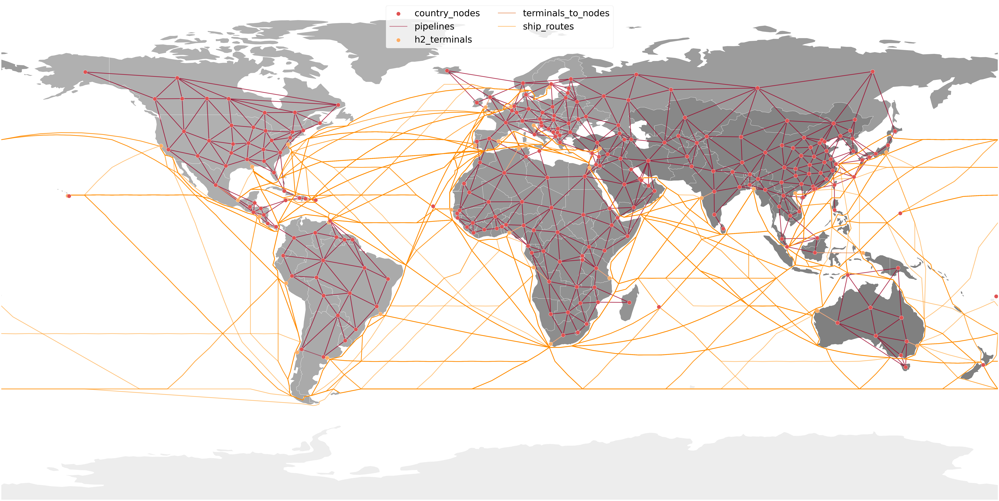

In [111]:
base = world.plot(color='#a8a8a8', linewidth=0.5, edgecolor='white', figsize=(100,80), alpha=0.2)
north_america.plot(ax=base, color="#b0b0b0", markersize=5, edgecolor='white')
central_america.plot(ax=base, color='#aeaeae', markersize=5, edgecolor='white')
caribbean.plot(ax=base, color='#acacac', markersize=5, edgecolor='white')
east_coast_south_america.plot(ax=base, color='#aaaaaa', markersize=5, edgecolor='white')
west_coast_south_america.plot(ax=base, color='#a7a7a7', markersize=5, edgecolor='white')
northern_europe.plot(ax=base, color='#a5a5a5', markersize=5, edgecolor='white')
central_europe.plot(ax=base, color='#a3a3a3', markersize=5, edgecolor='white')
southern_europe.plot(ax=base, color='#a1a1a1', markersize=5, edgecolor='white')
eastern_europe.plot(ax=base, color='#9e9e9e', markersize=5, edgecolor='white')
russia_belarus.plot(ax=base, color='#9c9c9c', markersize=5, edgecolor='white')
northern_africa.plot(ax=base, color='#9a9a9a', markersize=5, edgecolor='white')
sahel_zone.plot(ax=base, color='#989898', markersize=5, edgecolor='white')
north_west_coast_africa.plot(ax=base, color='#959595', markersize=5, edgecolor='white')
east_coast_africa.plot(ax=base, color='#939393', markersize=5, edgecolor='white')
south_central_africa.plot(ax=base, color='#919191', markersize=5, edgecolor='white')
west_coast_africa.plot(ax=base, color='#8f8f8f', markersize=5, edgecolor='white')
southern_africa.plot(ax=base, color='#8d8d8d', markersize=5, edgecolor='white')
middle_east.plot(ax=base, color='#8a8a8a', markersize=5, edgecolor='white')
central_asia.plot(ax=base, color='#888888', markersize=5, edgecolor='white')
southern_asia.plot(ax=base, color='#868686', markersize=5, edgecolor='white')
eastern_asia.plot(ax=base, color='#848484', markersize=5, edgecolor='white')
south_eastern_asia.plot(ax=base, color='#828282', markersize=5, edgecolor='white')
australia_oceania.plot(ax=base, color='#808080', markersize=5, edgecolor='white')
#cities.plot(ax=base, color='black', markersize=10, alpha=0.2)
#ports.plot(ax=base, color='black', markersize=20, alpha=0.2)
#rivers.plot(ax=base, color='blue', markersize=1, alpha=0.1)
new_nodes.plot(ax=base, color='#E05252', markersize=500, alpha=1, edgecolors='white', label="country_nodes", zorder=3)
h2_pipelines.plot(ax=base, color='#9e0027', linewidth=4, edgecolor='white', alpha=0.5, label="pipelines", zorder=1) #Linestringelemente
#terminal exeption
if q == 0:
    h2_terminals.plot(ax=base, color='#fead64', markersize=500, alpha=1,edgecolors='white', label="h2_terminals", zorder=2)
    con_line.plot(ax=base, color='#eba57c', linewidth=4, edgecolor='white', alpha=1, label="terminals_to_nodes", zorder=1) #Linestringelemente
    df_sr.plot(ax=base, color='#ff8c00', linewidth=4, edgecolor='white', alpha=0.5, label="ship_routes", zorder=1) #Linestringelemente
    #total_shipping[total_shipping["commodity"] == "h2"].plot(ax=base, color='#ff8c00', linewidth=4, edgecolor='white', alpha=0.5, label="ship_routes", zorder=1) #Linestringelemente
#df_sr.plot(ax=base, color='black', linewidth=3, edgecolor='white', alpha=0.5, zorder=1) #Linestringelemente
#df_sr.plot(ax=base, color='black', linewidth=3, edgecolor='white', alpha=0.5, zorder=1) #Linestringelemente
#deepsea.plot(ax=base, color='blue', markersize=5, edgecolor='white')
base.set_axis_off()
plt.legend(loc="upper center", ncol=2, fontsize=50)
plt.ylim(-90,90)
plt.xlim(-180,180)

Now the exports for Spine will be prepared:

What do I need?
- Nodes (node, node_el, node_h2, balance_type = balance_type_node, demand_el, demand_h2, y (latitude*(-1)), x (longitude))
- h2_terminals (node, node_h2,  balance_type = balance_type_node, demand_el, demand_h2, y (latitude*(-1)), x (longitude))
- connection (node1, node2, name, fix_ratio_out_in_connection_flow, length)
- connection__from_node (node1, node2)
- connection__to_node (node1, node2, connection_capacity)
- cuppling units ()
- unit__node__node ()
- unit__to_node ()
- unit__from_node ()

In [112]:
terminals = h2_terminals
terminals = terminals.rename(columns={"longitude":"x", "latitude":"y"})
terminals["y"] = terminals["y"]*(-1)
terminals["length"] = con_line["length"]
terminals["balance_type"] = "balance_type_node"

terminals

,terminal_name,commodity,name,city,node,region,y,x,terminal_connection_invest,terminal_connection_fom_rel,...,h2_retransf_invest_cost,h2_retransf_fom_cost,h2_retransf_connection_type,h2_retransf_connection_investment_variable_type,h2_retransf_lifetime,h2_retransf_efficiency_substantial,h2_retransf_efficiency_energetic,geometry,length,balance_type
0,terminal_EU-NLD,h2,h2_terminal_EU-NLD,Rotterdam,EU-NLD_h2,central_europe,-51.948455,4.140296,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (4.14030 51.94846),172.107133,balance_type_node
1,terminal_EU-PRT,h2,h2_terminal_EU-PRT,Sines,EU-PRT_h2,southern_europe,-37.961098,-8.878688,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (-8.87869 37.96110),283.039943,balance_type_node
2,terminal_EU-ESP,h2,h2_terminal_EU-ESP,Valencia,EU-ESP_h2,southern_europe,-39.463713,-0.358820,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (-0.35882 39.46371),525.717923,balance_type_node
3,terminal_EU-ITA,h2,h2_terminal_EU-ITA,Porto_Levante,EU-ITA_h2,southern_europe,-45.205817,12.293656,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (12.29366 45.20582),666.992679,balance_type_node
4,terminal_AS-TUR,h2,h2_terminal_AS-TUR,Dortyol,AS-TUR_h2,middle_east,-36.825941,36.177898,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (36.17790 36.82594),414.759638,balance_type_node
5,terminal_EU-SWE,h2,h2_terminal_EU-SWE,Brunnviksholmen,EU-SWE_h2,northern_europe,-58.913025,17.960510,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (17.96051 58.91302),360.542128,balance_type_node
6,terminal_EU-GBR,h2,h2_terminal_EU-GBR,Milford_Haven,EU-GBR_h2,northern_europe,-51.708290,-5.064630,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (-5.06463 51.70829),924.977537,balance_type_node
7,terminal_AS-QAT,h2,h2_terminal_AS-QAT,Ras_Laffan,AS-QAT_h2,middle_east,-25.883521,51.480261,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (51.48026 25.88352),95.076635,balance_type_node
8,terminal_AS-IND-WE,h2,h2_terminal_AS-IND-WE,Mumbai,AS-IND-WE_h2,southern_asia,-18.944742,72.950074,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (72.95007 18.94474),752.804337,balance_type_node
9,terminal_AS-BGD,h2,h2_terminal_AS-BGD,Chittagon,AS-BGD_h2,southern_asia,-22.256499,91.784942,298492.002209,0.009,...,0,0,connection_type_normal,connection_investment_variable_type_continuous,20,0.98,0.977498,POINT (91.78494 22.25650),305.219868,balance_type_node


In [113]:
#processing of the prepared dataframes to allow for easier readability in the ESM framework Spine

#1-Dimensional Importer Mappings
#h2_nodes
h2_nodes_concat_bal_ty    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"balance_type", "Alternative names":alternative, "Parameter values":new_nodes.balance_type})
h2_nodes_concat_y    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"x", "Alternative names":alternative, "Parameter values":new_nodes.y})
h2_nodes_concat_x    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"y", "Alternative names":alternative, "Parameter values":new_nodes.x})
h2_nodes_slack_pen    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"node_slack_penalty", "Alternative names":alternative, "Parameter values":node_slack_pen})
h2_nodes_demand    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"demand", "Alternative names":alternative, "Parameter values":new_nodes.h2_demand})
h2_nodes_tax_net_unit_flow    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"tax_net_unit_flow", "Alternative names":alternative, "Parameter values":new_nodes.tax_net_unit_flow})
h2_nodes_has_state    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"has_state", "Alternative names":alternative, "Parameter values":new_nodes.has_state})
h2_nodes_ini_state    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"initial_node_state", "Alternative names":alternative, "Parameter values":new_nodes.initial_node_state})
h2_nodes_state_cap    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"node_state_cap", "Alternative names":alternative, "Parameter values":new_nodes.node_state_cap})
h2_nodes_state_coeff    = pd.DataFrame({"Object_class_names":"node", "Object names 1":new_nodes.h2_node, "Parameter names":"node_state_coeff", "Alternative names":alternative, "Parameter values":new_nodes.node_state_coeff})
h2_nodes_concat_1D = pd.concat([h2_nodes_concat_bal_ty, h2_nodes_concat_y, h2_nodes_concat_x, h2_nodes_slack_pen, h2_nodes_demand, h2_nodes_tax_net_unit_flow, h2_nodes_has_state, h2_nodes_ini_state, h2_nodes_state_cap, h2_nodes_state_coeff], ignore_index=True)

#h2_terminals
if q == 0:
    h2_terminals_concat_bal_ty    = pd.DataFrame({"Object_class_names":"node", "Object names 1":terminals.name, "Parameter names":"balance_type", "Alternative names":alternative, "Parameter values":"balance_type_node"})
    h2_terminals_concat_y    = pd.DataFrame({"Object_class_names":"node", "Object names 1":terminals.name, "Parameter names":"y", "Alternative names":alternative, "Parameter values":terminals.y})
    h2_terminals_concat_x    = pd.DataFrame({"Object_class_names":"node", "Object names 1":terminals.name, "Parameter names":"x", "Alternative names":alternative, "Parameter values":terminals.x})
    h2_terminals_concat_1D = pd.concat([h2_terminals_concat_bal_ty, h2_terminals_concat_y, h2_terminals_concat_x], ignore_index=True)

#h2_pipelines
h2_pipelines_concat_cand_con    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":h2_pipelines.name, "Parameter names":"candidate_connections", "Alternative names":alternative, "Parameter values":h2_pipelines.candidate_connections})
h2_pipelines_concat_con_type    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":h2_pipelines.name, "Parameter names":"connection_type", "Alternative names":alternative, "Parameter values":"connection_type_normal"})
h2_pipelines_concat_inv_cost    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":h2_pipelines.name, "Parameter names":"connection_investment_cost", "Alternative names":alternative, "Parameter values":h2_pipelines.connection_investment_cost})
h2_pipelines_concat_inv_lifetime    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":h2_pipelines.name, "Parameter names":"connection_investment_lifetime", "Alternative names":alternative, "Parameter values":h2_pipelines.connection_investment_lifetime})
h2_pipelines_concat_inv_var_type    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":h2_pipelines.name, "Parameter names":"connection_investment_variable_type", "Alternative names":alternative, "Parameter values":"variable_type_continuous"})
h2_pipelines_concat_1D = pd.concat([h2_pipelines_concat_cand_con, h2_pipelines_concat_con_type, h2_pipelines_concat_inv_cost, h2_pipelines_concat_inv_lifetime, h2_pipelines_concat_inv_var_type], ignore_index=True)

#h2_terminal connections
if q == 0:
    h2_terminal_con_concat_cand_con    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":con_line.name, "Parameter names":"candidate_connections", "Alternative names":alternative, "Parameter values":con_line.candidate_connections})
    h2_terminal_con_concat_con_type    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":con_line.name, "Parameter names":"connection_type", "Alternative names":alternative, "Parameter values":"connection_type_normal"})
    h2_terminal_con_concat_inv_cost    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":con_line.name, "Parameter names":"connection_investment_cost", "Alternative names":alternative, "Parameter values":con_line.connection_investment_cost_origin})
    h2_terminal_con_concat_inv_lifetime    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":con_line.name, "Parameter names":"connection_investment_lifetime", "Alternative names":alternative, "Parameter values":connection_investment_lifetime})
    h2_terminal_con_concat_inv_var_type    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":con_line.name, "Parameter names":"connection_investment_variable_type", "Alternative names":alternative, "Parameter values":"variable_type_continuous"})
    h2_terminal_con_concat_1D = pd.concat([h2_terminal_con_concat_cand_con, h2_terminal_con_concat_con_type, h2_terminal_con_concat_inv_cost, h2_terminal_con_concat_inv_lifetime, h2_terminal_con_concat_inv_var_type], ignore_index=True)

#h2_ship connections
if q == 0:
    h2_ships_concat_cand_con    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":total_shipping.name, "Parameter names":"candidate_connections", "Alternative names":alternative, "Parameter values":total_shipping.candidate_connections})
    h2_ships_concat_con_type    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":total_shipping.name, "Parameter names":"connection_type", "Alternative names":alternative, "Parameter values":"connection_type_normal"})
    h2_ships_concat_inv_cost    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":total_shipping.name, "Parameter names":"connection_investment_cost", "Alternative names":alternative, "Parameter values": total_shipping.connection_investment_cost})
    h2_ships_concat_inv_lifetime    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":total_shipping.name, "Parameter names":"connection_investment_lifetime", "Alternative names":alternative, "Parameter values": connection_investment_lifetime})
    h2_ships_concat_inv_var_type    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":total_shipping.name, "Parameter names":"connection_investment_variable_type", "Alternative names":alternative, "Parameter values": "variable_type_continuous"})
    #h2_ships_concat_con_delay    = pd.DataFrame({"Object_class_names":"connection", "Object names 1":df_sr.name, "Parameter names":"connection_delay", "Alternative names":"Base", "Parameter values": df_sr.connection_delay})   #connection delay is not included yet due to shortened timescope in testing
    h2_ships_concat_1D = pd.concat([h2_ships_concat_cand_con, h2_ships_concat_con_type, h2_ships_concat_inv_cost, h2_ships_concat_inv_lifetime, h2_ships_concat_inv_var_type], ignore_index=True)

if q == 0:
    h2_connections_concat_1D = pd.concat([h2_nodes_concat_1D, h2_terminals_concat_1D, h2_pipelines_concat_1D, h2_terminal_con_concat_1D, h2_ships_concat_1D], ignore_index=True) #this dataframe will be exported to the ESM framework
    Else: h2_connections_concat_1D = pd.concat([h2_nodes_concat_1D], ignore_index=True) #this dataframe will be exported to the ESM framework

#2-Dimensional Importer Mappings
#h2_pipelines
h2_pipelines_concat_con_cap_f1    = pd.DataFrame({"Relationship class names":"connection__from_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":h2_pipelines.name, "Object names 2":h2_pipelines.h2_node1, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":h2_pipelines.connection_capacity})
h2_pipelines_concat_con_cap_f2    = pd.DataFrame({"Relationship class names":"connection__from_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":h2_pipelines.name, "Object names 2":h2_pipelines.h2_node2, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":h2_pipelines.connection_capacity})
h2_pipelines_concat_con_cap_t1    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":h2_pipelines.name, "Object names 2":h2_pipelines.h2_node1, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":h2_pipelines.connection_capacity})
h2_pipelines_concat_con_cap_t2    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":h2_pipelines.name, "Object names 2":h2_pipelines.h2_node2, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":h2_pipelines.connection_capacity})
h2_pipelines_concat_con_flow_cost_t1    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":h2_pipelines.name, "Object names 2":h2_pipelines.h2_node1, "Parameter names":"connection_flow_cost", "Alternative names":alternative, "Parameter values":connection_flow_cost*2})
h2_pipelines_concat_con_flow_cost_t2    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":h2_pipelines.name, "Object names 2":h2_pipelines.h2_node2, "Parameter names":"connection_flow_cost", "Alternative names":alternative, "Parameter values":connection_flow_cost*2})
h2_pipelines_concat_2D = pd.concat([h2_pipelines_concat_con_cap_f1, h2_pipelines_concat_con_cap_f2, h2_pipelines_concat_con_cap_t1, h2_pipelines_concat_con_cap_t2, h2_pipelines_concat_con_flow_cost_t1, h2_pipelines_concat_con_flow_cost_t2], ignore_index=True)

#h2_terminal connections
if q == 0:
    h2_terminal_con_concat_con_cap_f1    = pd.DataFrame({"Relationship class names":"connection__from_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":con_line.name, "Object names 2":con_line.node1, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":con_line.connection_capacity})
    h2_terminal_con_concat_con_cap_f2    = pd.DataFrame({"Relationship class names":"connection__from_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":con_line.name, "Object names 2":con_line.node2, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":con_line.connection_capacity})
    h2_terminal_con_concat_con_cap_t1    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":con_line.name, "Object names 2":con_line.node1, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":con_line.connection_capacity})
    h2_terminal_con_concat_con_cap_t2    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":con_line.name, "Object names 2":con_line.node2, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":con_line.connection_capacity})
    h2_terminal_con_concat_con_flow_cost_t1    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":con_line.name, "Object names 2":con_line.node1, "Parameter names":"connection_flow_cost", "Alternative names":alternative, "Parameter values":connection_flow_cost*2})
    h2_terminal_con_concat_con_flow_cost_t2    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":con_line.name, "Object names 2":con_line.node2, "Parameter names":"connection_flow_cost", "Alternative names":alternative, "Parameter values":connection_flow_cost*2})
    h2_terminal_con_concat_2D = pd.concat([h2_terminal_con_concat_con_cap_f1, h2_terminal_con_concat_con_cap_f2, h2_terminal_con_concat_con_cap_t1, h2_terminal_con_concat_con_cap_t2, h2_terminal_con_concat_con_flow_cost_t1, h2_terminal_con_concat_con_flow_cost_t2], ignore_index=True)

#h2_ship connections
if q == 0:
    h2_ships_concat_con_cap_f1    = pd.DataFrame({"Relationship class names":"connection__from_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":total_shipping.name, "Object names 2":total_shipping.origin, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":total_shipping.connection_capacity})
    h2_ships_concat_con_cap_f2    = pd.DataFrame({"Relationship class names":"connection__from_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":total_shipping.name, "Object names 2":total_shipping.destination, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":total_shipping.connection_capacity})
    h2_ships_concat_con_cap_t1    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":total_shipping.name, "Object names 2":total_shipping.origin, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":total_shipping.connection_capacity})
    h2_ships_concat_con_cap_t2    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":total_shipping.name, "Object names 2":total_shipping.destination, "Parameter names":"connection_capacity", "Alternative names":alternative, "Parameter values":total_shipping.connection_capacity})
    h2_ships_concat_con_flow_cost_t1    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":total_shipping.name, "Object names 2":total_shipping.origin, "Parameter names":"connection_flow_cost", "Alternative names":alternative, "Parameter values":connection_flow_cost})
    h2_ships_concat_con_flow_cost_t2    = pd.DataFrame({"Relationship class names":"connection__to_node", "Object_class_names":"connection", "Object class names 1":"node", "Object names 1":total_shipping.name, "Object names 2":total_shipping.destination, "Parameter names":"connection_flow_cost", "Alternative names":alternative, "Parameter values":connection_flow_cost})
    h2_ships_concat_2D = pd.concat([h2_ships_concat_con_cap_f1, h2_ships_concat_con_cap_f2, h2_ships_concat_con_cap_t1, h2_ships_concat_con_cap_t2, h2_ships_concat_con_flow_cost_t1, h2_ships_concat_con_flow_cost_t2], ignore_index=True)

if q == 0:
    h2_connections_concat_2D = pd.concat([h2_pipelines_concat_2D, h2_terminal_con_concat_2D, h2_ships_concat_2D], ignore_index=True) #this dataframe will be exported to the ESM framework
    Else: h2_connections_concat_2D = pd.concat([h2_pipelines_concat_2D], ignore_index=True) #this dataframe will be exported to the ESM framework

#3-Dimensional Importer Mappings
#h2_pipelines
h2_pipelines_concat_fix_ratio_io1    = pd.DataFrame({"Relationship class names":"connection__node__node", "Object_class_names":"connection", "Object class names 1":"node", "Object class names 2":"node", "Object names 1":h2_pipelines.name, "Object names 2":h2_pipelines.h2_node1, "Object names 3":h2_pipelines.h2_node2, "Parameter names":"fix_ratio_out_in_connection_flow", "Alternative names":alternative, "Parameter values":h2_pipelines.fix_ratio_out_in_connection_flow})
h2_pipelines_concat_fix_ratio_io2    = pd.DataFrame({"Relationship class names":"connection__node__node", "Object_class_names":"connection", "Object class names 1":"node", "Object class names 2":"node", "Object names 1":h2_pipelines.name, "Object names 2":h2_pipelines.h2_node2, "Object names 3":h2_pipelines.h2_node1, "Parameter names":"fix_ratio_out_in_connection_flow", "Alternative names":alternative, "Parameter values":h2_pipelines.fix_ratio_out_in_connection_flow})
h2_pipelines_concat_3D = pd.concat([h2_pipelines_concat_fix_ratio_io1, h2_pipelines_concat_fix_ratio_io2], ignore_index=True)

#h2_terminal connections
if q == 0:
    h2_terminal_con_concat_fix_ratio_io1    = pd.DataFrame({"Relationship class names":"connection__node__node", "Object_class_names":"connection", "Object class names 1":"node", "Object class names 2":"node", "Object names 1":con_line.name, "Object names 2":con_line.node1, "Object names 3":con_line.node2, "Parameter names":"fix_ratio_out_in_connection_flow", "Alternative names":alternative, "Parameter values":con_line.fix_ratio_out_in_connection_flow})
    h2_terminal_con_concat_fix_ratio_io2    = pd.DataFrame({"Relationship class names":"connection__node__node", "Object_class_names":"connection", "Object class names 1":"node", "Object class names 2":"node", "Object names 1":con_line.name, "Object names 2":con_line.node2, "Object names 3":con_line.node1, "Parameter names":"fix_ratio_out_in_connection_flow", "Alternative names":alternative, "Parameter values":con_line.fix_ratio_out_in_connection_flow})
    h2_terminal_con_concat_3D = pd.concat([h2_terminal_con_concat_fix_ratio_io1, h2_terminal_con_concat_fix_ratio_io2], ignore_index=True)

#h2_ship connections
if q == 0:
    h2_ships_concat_fix_ratio_io1    = pd.DataFrame({"Relationship class names":"connection__node__node", "Object_class_names":"connection", "Object class names 1":"node", "Object class names 2":"node", "Object names 1":total_shipping.name, "Object names 2":total_shipping.origin, "Object names 3":total_shipping.destination, "Parameter names":"fix_ratio_out_in_connection_flow", "Alternative names":alternative, "Parameter values":total_shipping.fix_ratio_out_in_connection_flow})
    h2_ships_concat_fix_ratio_io2    = pd.DataFrame({"Relationship class names":"connection__node__node", "Object_class_names":"connection", "Object class names 1":"node", "Object class names 2":"node", "Object names 1":total_shipping.name, "Object names 2":total_shipping.destination, "Object names 3":total_shipping.origin, "Parameter names":"fix_ratio_out_in_connection_flow", "Alternative names":alternative, "Parameter values":total_shipping.fix_ratio_out_in_connection_flow})
    h2_ships_concat_3D = pd.concat([h2_ships_concat_fix_ratio_io1, h2_ships_concat_fix_ratio_io2], ignore_index=True)

if q == 0:
    h2_connections_concat_3D = pd.concat([h2_pipelines_concat_3D, h2_terminal_con_concat_3D, h2_ships_concat_3D], ignore_index=True) #this dataframe will be exported to the ESM framework
    Else: h2_connections_concat_3D = pd.concat([h2_pipelines_concat_3D], ignore_index=True) #this dataframe will be exported to the ESM framework

#h2_connections_concat_1D
h2_connections_concat_2D
#h2_connections_concat_3D

,Relationship class names,Object_class_names,Object class names 1,Object names 1,Object names 2,Parameter names,Alternative names,Parameter values
0,connection__from_node,connection,node,NA-USA-AK_h2_NA-CAN-NO_h2,NA-USA-AK_h2,connection_capacity,20230728_13_30,10000000000
1,connection__from_node,connection,node,EU-FIN_h2_AS-RUS-NW_h2,EU-FIN_h2,connection_capacity,20230728_13_30,10000000000
2,connection__from_node,connection,node,AS-RUS-NW_h2_AS-RUS-MV_h2,AS-RUS-NW_h2,connection_capacity,20230728_13_30,10000000000
3,connection__from_node,connection,node,AS-RUS-MV_h2_AS-RUS-UR_h2,AS-RUS-MV_h2,connection_capacity,20230728_13_30,10000000000
4,connection__from_node,connection,node,AS-RUS-UR_h2_AS-RUS-NW_h2,AS-RUS-UR_h2,connection_capacity,20230728_13_30,10000000000
...,...,...,...,...,...,...,...,...
11911,connection__to_node,connection,node,h2_terminal_AF-DZA_h2_terminal_AS-IND-WE,h2_terminal_AS-IND-WE,connection_flow_cost,20230728_13_30,1
11912,connection__to_node,connection,node,h2_terminal_AF-DZA_h2_terminal_NA-USA-HA,h2_terminal_NA-USA-HA,connection_flow_cost,20230728_13_30,1
11913,connection__to_node,connection,node,h2_terminal_EU-GBR_h2_terminal_AS-IND-WE,h2_terminal_AS-IND-WE,connection_flow_cost,20230728_13_30,1
11914,connection__to_node,connection,node,h2_terminal_EU-GBR_h2_terminal_NA-USA-HA,h2_terminal_NA-USA-HA,connection_flow_cost,20230728_13_30,1


In [114]:
# create a excel writer object and export the preprocessed transport model data
with pd.ExcelWriter(os.path.join(data_pth_output, "transport_objects.xlsx")) as writer:
   
    # use to_excel function and specify the sheet_name and index to store the dataframe in specified sheet
    #new_nodes.to_excel(writer, sheet_name="nodes", index=False)
    #h2_pipelines.to_excel(writer, sheet_name="h2_pipelines", index=False)
    #terminals.to_excel(writer, sheet_name="h2_ships", index=False)
    #con_line.to_excel(writer, sheet_name="terminal_connections", index=False)
    #df_sr.to_excel(writer, sheet_name="shipping_routes", index=False)
    h2_connections_concat_1D.to_excel(writer, sheet_name="h2_connections_1D", index=False)
    h2_connections_concat_2D.to_excel(writer, sheet_name="h2_connections_2D", index=False)
    h2_connections_concat_3D.to_excel(writer, sheet_name="h2_connections_3D", index=False)

Now that the model is exported - from here on the script aims to investigate and visualize the model results

In [115]:
#this part of the code can be used to locate missmatching keys for .merging()

# mask = total_shipping_es["name"].str.contains("h2_terminal_EU-SWE_h2_terminal_AS-IDN", na=True) #["h2_terminal_SA-CHL_h2_terminal_SA-BRA-SE"]
# total_shipping_es.loc[mask]

# mask = h2_connections_results_from["name"].str.contains("h2_terminal_EU-SWE_h2_terminal_AS-IDN", na=True) #["h2_terminal_SA-CHL_h2_terminal_SA-BRA-SE"]
# h2_connections_results_from.loc[mask]

In [187]:
#import model  result data
h2_connections_results = pd.read_excel(os.path.join(data_pth_model_results, "exported_db_url@Output20230802.xlsx"), sheet_name=0, header = None)
h2_connections_results = h2_connections_results.transpose()
h2_connections_results.columns = h2_connections_results.iloc[0]
h2_connections_results = h2_connections_results[1:]
h2_connections_results.columns.values[0] = "definition"
h2_connections_results.columns.values[2] = "connection_type"
h2_connections_results = h2_connections_results.rename(columns={"node":"name","stochastic_scenario":"node"})

#preprocessing of nodal results
node_slack_pos = h2_connections_results.drop(h2_connections_results[h2_connections_results["definition"] != "node_slack_pos"].index)
node_slack_pos = node_slack_pos.drop(columns=["connection_type","definition","node","2000-01-02T00:00:00"])
node_slack_pos = node_slack_pos.rename(columns={"name":"h2_node"})
node_slack_pos = new_nodes.merge(node_slack_pos, how="left")
node_slack_pos = node_slack_pos.rename(columns={"2000-01-01T00:00:00":"slack_p"})

node_slack_neg = h2_connections_results.drop(h2_connections_results[h2_connections_results["definition"] != "node_slack_neg"].index)
node_slack_neg = node_slack_neg.drop(columns=["connection_type","definition","node","2000-01-02T00:00:00"])
node_slack_neg = node_slack_neg.rename(columns={"name":"h2_node"})
node_slack_neg = node_slack_pos.merge(node_slack_neg, how="left")
node_slack_neg = node_slack_neg.rename(columns={"2000-01-01T00:00:00":"slack_n"})

node_injection = h2_connections_results.drop(h2_connections_results[h2_connections_results["definition"] != "node_injection"].index)
node_injection = node_injection.drop(columns=["connection_type","definition","node","2000-01-02T00:00:00"])
node_injection = node_injection.rename(columns={"name":"h2_node"})
node_injection = node_slack_neg.merge(node_injection, how="left")
node_injection = node_injection.rename(columns={"2000-01-01T00:00:00":"injection"})

node_results = node_injection[["h2_node", "name", "x", "y", "h2_demand_gross", "h2_demand", "max_h2_pot", "balance_type", "tax_net_unit_flow", "geometry", "slack_p", "slack_n", "injection"]] #binding together the results for slack and injection with the original demand information of the nodes
# node_injection["value"] = node_injection["value"].abs() #optional if representation shall be as dot diameter and not in a bar graph

#preprocessing of pipeline results
h2_connections_results_from = h2_connections_results.drop(h2_connections_results[h2_connections_results["connection_type"] != ("from_node")].index)
h2_connections_results_to = h2_connections_results.drop(h2_connections_results[h2_connections_results["connection_type"] != ("to_node")].index)

h2_connections_results_from = h2_connections_results_from.drop(columns=["connection_type","definition","node","2000-01-02T00:00:00"])
h2_connections_results_to = h2_connections_results_to.drop(columns=["connection_type","definition","node","2000-01-02T00:00:00"])

h2_connections_results_from = h2_connections_results_from.rename(columns={"2000-01-01T00:00:00":"flow_from"})
h2_connections_results_to = h2_connections_results_to.rename(columns={"2000-01-01T00:00:00":"flow_to"})

h2_connections_results_from["flow_from"] = h2_connections_results_from["flow_from"].astype(float).round(decimals=2)
h2_connections_results_to["flow_to"] = h2_connections_results_to["flow_to"].astype(float).round(decimals=2)

h2_connections_results_from = h2_connections_results_from.groupby('name')['flow_from'].sum().reset_index()
h2_connections_results_to = h2_connections_results_to.groupby('name')['flow_to'].sum().reset_index()
#h2_connections_results_from = h2_connections_results_from.drop_duplicates(subset="name")

h2_connections_results_from = h2_connections_results_from.merge(h2_connections_results_to, on="name", how="left")

scale_factor = 0.6

total_shipping_es = total_shipping[["name", "geometry", "origin", "destination"]]
h2_shipping_results = total_shipping_es.merge(h2_connections_results_from, on="name", how="left")
h2_shipping_results["flow_from_log"] = np.where(h2_shipping_results["flow_from"] == 0, 0, np.exp(np.log(h2_shipping_results["flow_from"]) * scale_factor))
#max_flow_shipping = h2_shipping_results["flow"].max()
con_line_es = con_line[["name", "geometry", "terminal_name", "node1", "node2", "node"]]
h2_conline_results = con_line_es.merge(h2_connections_results_from, on="name", how="left")
h2_conline_results["flow_from_log"] = np.where(h2_conline_results["flow_from"] == 0, 0, np.exp(np.log(h2_conline_results["flow_from"]) * scale_factor))
#max_flow_conline = h2_conline_results["flow"].max()
h2_pipelines_es = h2_pipelines[["name", "geometry", "h2_node1", "h2_node2"]]
h2_pipelines_results = h2_pipelines_es.merge(h2_connections_results_from, on="name", how="left")
h2_pipelines_results["flow_from_log"] = np.where(h2_pipelines_results["flow_from"] == 0, 0, np.exp(np.log(h2_pipelines_results["flow_from"]) * scale_factor))
#max_flow_pipelines = h2_pipelines_results["flow"].max()

#preprocessing of node information
node_results_none = node_results.drop(node_results[node_results["tax_net_unit_flow"] >= 52].index)
#node_results_none = h2_pipelines_results.drop(h2_pipelines_results[h2_pipelines_results["connection_flow"] > 0]) # attempt to filter by positive flow connection_from_node ti identifiy the source nodes and their outflows

#h2_pipelines
# df_sr_results
# test_df_none
# node_slack_pos
# node_injection
# node_results_none
h2_pipelines_results.head(10)
#h2_shipping_results.tail(60)
#h2_conline_results.head(20)
# print(max_flow_pipeline)
# print(max_flow_terminal)
# print(max_flow_ship)
#test_df_none_2
#node_results
#node_results_none

c:\Users\oliver\mambaforge\envs\geo_tools\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\oliver\mambaforge\envs\geo_tools\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\oliver\mambaforge\envs\geo_tools\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,name,geometry,h2_node1,h2_node2,flow_from,flow_to,flow_from_log
0,NA-USA-AK_h2_NA-CAN-NO_h2,"LINESTRING (-149.68091 64.44596, -116.45058 62...",NA-USA-AK_h2,NA-CAN-NO_h2,0.00,0.00,0.000000
1,EU-FIN_h2_AS-RUS-NW_h2,"LINESTRING (25.74815 61.92411, 49.39031 63.56293)",EU-FIN_h2,AS-RUS-NW_h2,0.00,0.00,0.000000
2,AS-RUS-NW_h2_AS-RUS-MV_h2,"LINESTRING (49.39031 63.56293, 46.54964 54.34837)",AS-RUS-NW_h2,AS-RUS-MV_h2,0.00,0.00,0.000000
3,AS-RUS-MV_h2_AS-RUS-UR_h2,"LINESTRING (46.54964 54.34837, 61.92033 58.10940)",AS-RUS-MV_h2,AS-RUS-UR_h2,0.00,0.00,0.000000
4,AS-RUS-UR_h2_AS-RUS-NW_h2,"LINESTRING (61.92033 58.10940, 49.39031 63.56293)",AS-RUS-UR_h2,AS-RUS-NW_h2,0.00,0.00,0.000000
5,AS-RUS-FE_h2_AS-JPN-HO_h2,"LINESTRING (134.75310 64.61839, 142.82311 43.1...",AS-RUS-FE_h2,AS-JPN-HO_h2,5443.18,5334.31,174.386001
6,AS-RUS-NW_h2_AS-RUS-SI_h2,"LINESTRING (49.39031 63.56293, 93.19097 58.68187)",AS-RUS-NW_h2,AS-RUS-SI_h2,14098.22,13816.26,308.672948
7,AS-RUS-SI_h2_AS-RUS-FE_h2,"LINESTRING (93.19097 58.68187, 134.75310 64.61...",AS-RUS-SI_h2,AS-RUS-FE_h2,0.00,0.00,0.000000
8,AS-RUS-SI_h2_AS-RUS-NW_h2,"LINESTRING (93.19097 58.68187, 49.39031 63.56293)",AS-RUS-SI_h2,AS-RUS-NW_h2,0.00,0.00,0.000000
9,AS-RUS-NW_h2_AS-RUS-UR_h2,"LINESTRING (49.39031 63.56293, 61.92033 58.10940)",AS-RUS-NW_h2,AS-RUS-UR_h2,0.00,0.00,0.000000


In [188]:
#Here the flows in and out of a node are being balanced to figure out whether 1. the sum of flows adds up 2. to identify the amount of hydrogen that flows out of the node for visualization

node_results
h2_pipelines_results_m = h2_pipelines_results[["h2_node1", "h2_node2", "flow_from", "flow_to"]]
h2_pipelines_results_m = h2_pipelines_results_m.rename(columns={"h2_node1":"h2_node"})
h2_node_flow_balance = node_results.merge(h2_pipelines_results_m, on="h2_node", how = "left")
h2_node_flow_balance_c = h2_node_flow_balance.groupby('h2_node')[['flow_from', "flow_to", "injection", "slack_p", "slack_n"]].sum().reset_index()

node_results = node_results.drop(columns={"slack_p", "slack_n", "injection"})
h2_node_flow_balance = node_results.merge(h2_node_flow_balance_c, on="h2_node", how = "left")

print(h2_node_flow_balance["flow_from"].max())

h2_node_flow_balance

289555.07999999996


,h2_node,name,x,y,h2_demand_gross,h2_demand,max_h2_pot,balance_type,tax_net_unit_flow,geometry,flow_from,flow_to,injection,slack_p,slack_n
0,AF-AGO_h2,AF-AGO,17.873887,11.202692,5206.416916,4700.907074,44527.423289,balance_type_node,65.526553,POINT (17.87389 -11.20269),0.00,0.00,-28205.442444,0,0
1,AF-BDI_h2,AF-BDI,29.918886,3.373056,208.267439,188.046000,1781.188972,balance_type_node,70.987099,POINT (29.91889 -3.37306),0.00,0.00,-752.184,0,0
2,AF-BEN_h2,AF-BEN,2.315834,-9.307690,1276.406683,1152.475743,10916.356021,balance_type_node,76.447645,POINT (2.31583 9.30769),556.29,545.16,-5762.378715,0,0
3,AF-BFA_h2,AF-BFA,-1.561593,-12.238333,1416.492391,1278.960023,12114.426731,balance_type_node,62.796280,POINT (-1.56159 12.23833),0.00,0.00,-8952.720161,0,0
4,AF-BWA_h2,AF-BWA,24.684866,22.328474,1264.077719,1141.343843,10810.913644,balance_type_node,51.875188,POINT (24.68487 -22.32847),6276.94,6151.39,-7989.406903,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256,SA-PER_h2,SA-PER,-75.015152,9.189967,14116.469973,10340.287728,410681.854160,balance_type_node,46.414641,POINT (-75.01515 -9.18997),3195.48,3131.57,-41361.150913,0,0
257,SA-PRY_h2,SA-PRY,-58.443832,23.442503,2465.206654,1805.759241,71718.754147,balance_type_node,57.335734,POINT (-58.44383 -23.44250),0.00,0.00,-10834.555448,0,0
258,SA-SUR_h2,SA-SUR,-56.027783,-3.919305,180.977788,132.565889,5265.076434,balance_type_node,60.066007,POINT (-56.02778 3.91931),0.00,0.00,-662.829447,0,0
259,SA-URY_h2,SA-URY,-55.765835,32.522779,3750.882409,2747.514316,109122.135028,balance_type_node,54.605461,POINT (-55.76584 -32.52278),0.00,0.00,-8242.542949,0,0


In [189]:
#This is a short check whether there is node_slack that occurs and if yes, how much 

node_slack = h2_connections_results.drop(h2_connections_results[h2_connections_results["definition"] != ("node_slack_pos")].index)
node_slack = node_slack.drop(node_slack[node_slack["2000-01-01T00:00:00"] == 0].index)
node_slack["2000-01-01T00:00:00"].sum()
node_slack

,definition,name,connection_type,node,2000-01-01T00:00:00,2000-01-02T00:00:00
8508,node_slack_pos,AF-CPV_h2,NaN,realization,136.076017,136.076017
8530,node_slack_pos,AF-MSU_h2,NaN,realization,745.178188,745.178188
8712,node_slack_pos,NA-USA-GU_h2,NaN,realization,280.195739,280.195739
8738,node_slack_pos,OC-FJI_h2,NaN,realization,175.243676,175.243676


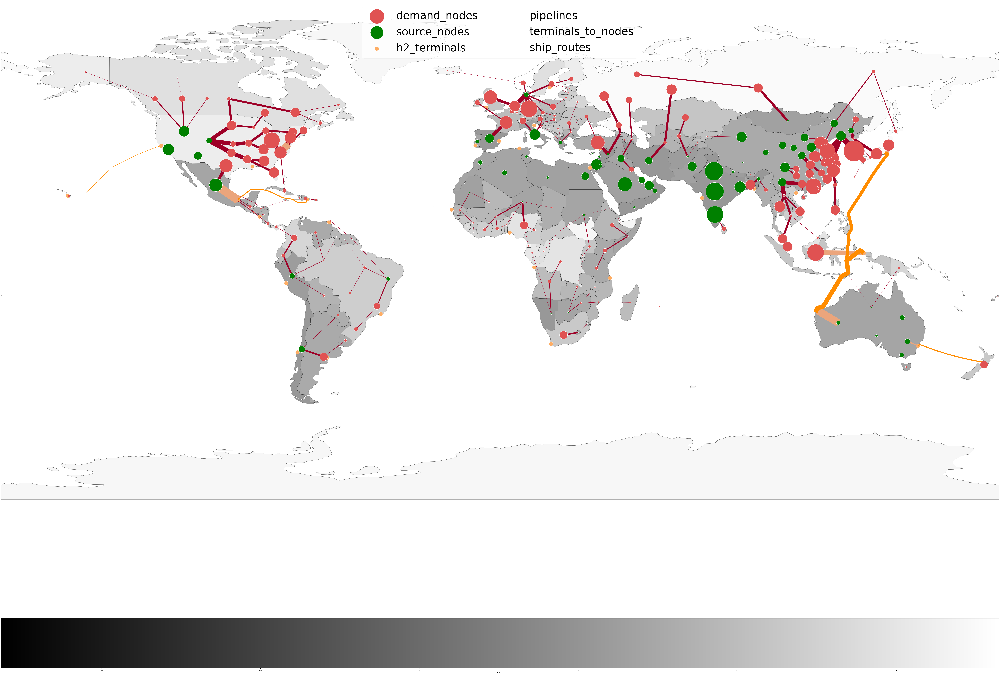

In [190]:
#How to insert bar charts into map diagrams
#code source: https://stackoverflow.com/questions/55854988/subplots-onto-a-basemap/55890475#55890475
#https://stackoverflow.com/questions/75825601/how-can-i-add-bar-charts-at-certain-locations-to-a-geopandas-map-using-the-same/75848560#75848560


#from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.pyplot as plt
import mpl_toolkits
import numpy as np
import matplotlib.patches as mpatches

# function to create inset axes and plot bar chart on it
# this is good for 3 items bar chart
def build_bar(mapx, mapy, ax, width, xvals=['a','b'], yvals=[1,4,2], fcolors=['r','y','b']):
    ax_h = inset_axes(ax, width=width, \
                    height=width, \
                    loc=3, \
                    bbox_to_anchor=(mapx, mapy), \
                    bbox_transform=ax.transData, \
                    borderpad=0, \
                    axes_kwargs={'alpha': 0.35, 'visible': True})
    for x,y,c in zip(xvals, yvals, fcolors):
        ax_h.bar(x, y, label=str(x), fc=c)
    #ax.xticks(range(len(xvals)), xvals, fontsize=10, rotation=30)
    ax_h.axis('off')
    return ax_h

# def build_pie(x, y, ax, radius, values, colors):
#     plt.scatter(x, y)  # Center point for the pie chart
#     plt.pie(values, colors=colors, radius=radius, autopct='%1.1f%%', startangle=90)
#     plt.axis('equal')

base = world.plot(linewidth=0.5, color='#a8a8a8', edgecolor='white', figsize=(100,80), alpha=0.2)
world_cost.plot(ax=base, linewidth=1, column=world_cost['tax_net_unit_flow'], cmap='gray', edgecolor='white', alpha=1, legend=True, legend_kwds={"label": "€/GWh H2", "orientation": "horizontal"},
                missing_kwds={"color": "lightgrey", "edgecolor": "red","hatch": "///","label": "Missing values"}) #color='#a8a8a8' RdYlGn_r
# north_america.plot(ax=base, color="#b0b0b0", markersize=5, edgecolor='white', alpha=0.5)
# central_america.plot(ax=base, color='#aeaeae', markersize=5, edgecolor='white', alpha=0.5)
# caribbean.plot(ax=base, color='#acacac', markersize=5, edgecolor='white', alpha=0.5)
# east_coast_south_america.plot(ax=base, color='#aaaaaa', markersize=5, edgecolor='white', alpha=0.5)
# west_coast_south_america.plot(ax=base, color='#a7a7a7', markersize=5, edgecolor='white', alpha=0.5)
# northern_europe.plot(ax=base, color='#a5a5a5', markersize=5, edgecolor='white', alpha=0.5)
# central_europe.plot(ax=base, color='#a3a3a3', markersize=5, edgecolor='white', alpha=0.5)
# southern_europe.plot(ax=base, color='#a1a1a1', markersize=5, edgecolor='white', alpha=0.5)
# eastern_europe.plot(ax=base, color='#9e9e9e', markersize=5, edgecolor='white', alpha=0.5)
# russia_belarus.plot(ax=base, color='#9c9c9c', markersize=5, edgecolor='white', alpha=0.5)
# northern_africa.plot(ax=base, color='#9a9a9a', markersize=5, edgecolor='white', alpha=0.5)
# sahel_zone.plot(ax=base, color='#989898', markersize=5, edgecolor='white', alpha=0.5)
# north_west_coast_africa.plot(ax=base, color='#959595', markersize=5, edgecolor='white', alpha=0.5)
# east_coast_africa.plot(ax=base, color='#939393', markersize=5, edgecolor='white', alpha=0.5)
# south_central_africa.plot(ax=base, color='#919191', markersize=5, edgecolor='white', alpha=0.5)
# west_coast_africa.plot(ax=base, color='#8f8f8f', markersize=5, edgecolor='white', alpha=0.5)
# southern_africa.plot(ax=base, color='#8d8d8d', markersize=5, edgecolor='white', alpha=0.5)
# middle_east.plot(ax=base, color='#8a8a8a', markersize=5, edgecolor='white', alpha=0.5)
# central_asia.plot(ax=base, color='#888888', markersize=5, edgecolor='white', alpha=0.5)
# southern_asia.plot(ax=base, color='#868686', markersize=5, edgecolor='white', alpha=0.5)
# eastern_asia.plot(ax=base, color='#848484', markersize=5, edgecolor='white', alpha=0.5)
# south_eastern_asia.plot(ax=base, color='#828282', markersize=5, edgecolor='white', alpha=0.5)
# australia_oceania.plot(ax=base, color='#808080', markersize=5, edgecolor='white', alpha=0.5)
world.plot(ax=base, color="white", markersize=5, edgecolor='black', alpha=0.6)
node_results.plot(ax=base, color="#E05252", markersize=node_results["h2_demand_gross"]/15, alpha=1, edgecolors='white', label="demand_nodes", zorder=4) #demand overlay '#cd7565'
node_results_none.plot(ax=base, color='green', markersize=node_results_none["h2_demand_gross"]/15, alpha=1, edgecolors='white', label="source_nodes", zorder=5) #balance_type differentiation
h2_terminals.plot(ax=base, color='#fead64', markersize=500, alpha=1,edgecolors='white', label="h2_terminals", zorder=2)
h2_pipelines_results.plot(ax=base, color='#9e0027', linewidth=h2_pipelines_results['flow_from_log']/50, alpha=1, label="pipelines", zorder=2) #/(max_flow_pipeline+0.01)*100 h2_pipelines_results['flow']/max_flow_pipeline*1000 vmin=0, vmax=1
h2_conline_results.plot(ax=base, color='#eba57c', linewidth=h2_conline_results['flow_from_log']/50, alpha=1, label="terminals_to_nodes", zorder=2) #column='name',
h2_shipping_results.plot(ax=base, color='#ff8c00', linewidth=h2_shipping_results['flow_from_log']/50, alpha=1, label="ship_routes", zorder=2) #column='name'
h2_shipping_results["geometry"].translate(xoff=-360).plot(ax=base, color='#ff8c00', linewidth=h2_shipping_results['flow_from_log']/50, alpha=1, zorder=2) #column='name',
h2_shipping_results["geometry"].translate(xoff=360).plot(ax=base, color='#ff8c00', linewidth=h2_shipping_results["flow_from_log"]/50, alpha=1, zorder=2) #column='name'
plt.legend(loc="upper center", ncol=2, fontsize=60)
plt.ylim(-90,90)
plt.xlim(-180,180)

# #create a barchart at each location for comparison between node demand, injection and slack in (lon1s,lat1s)
# bar_width = 0.1  # inch
# colors = ['orange','purple','red']
# for i in node_results.index:
#     x1 = node_results["x"][i]   # get data coordinates for plotting
#     y1 = node_results["y"][i]*(-1)   # get data coordinates for plotting
#     bax = build_bar(x1, y1, base, width=0.5, xvals=("h2_demand", "injection", "slack_n"), \
#               yvals = [node_results["h2_demand"][i], node_results["injection"][i], node_results["slack_n"][i]], \
#               fcolors=colors)
    
# colors = ['#E05252','green']
# for i in node_results.index:
#     x1 = node_results["x"][i]   # get data coordinates for plotting
#     y1 = node_results["y"][i]*(-1)   # get data coordinates for plotting
#     bax = build_pie(x1, y1, base, 1, [node_results["h2_demand"][i], -node_results["injection"][i]], colors)
#     plt.title(f"Node {i+1} Data")
#     plt.ylim(-90,90)
#     plt.xlim(-180,180)
#     plt.show()


base.set_axis_off()

#über colorband machen? https://matplotlib.org/stable/tutorials/colors/colormaps.html

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


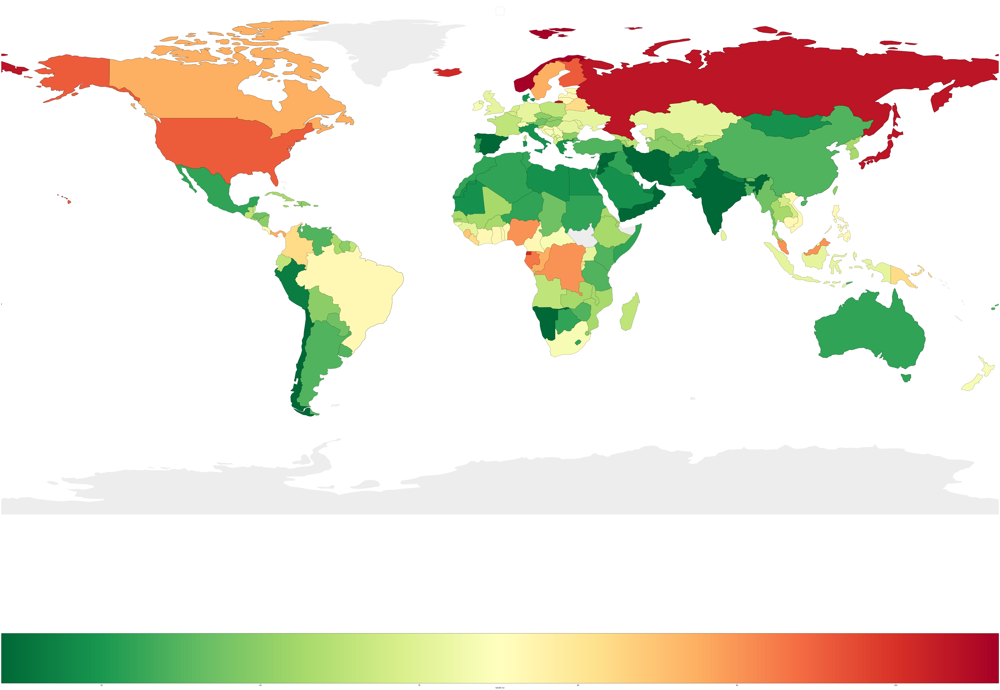

In [120]:
#How to insert bar charts into map diagrams
#code source: https://stackoverflow.com/questions/55854988/subplots-onto-a-basemap/55890475#55890475
#https://stackoverflow.com/questions/75825601/how-can-i-add-bar-charts-at-certain-locations-to-a-geopandas-map-using-the-same/75848560#75848560


#from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.pyplot as plt
import mpl_toolkits
import numpy as np
import matplotlib.patches as mpatches

base = world.plot(linewidth=0.5, color='#a8a8a8', edgecolor='white', figsize=(100,80), alpha=0.2)
world_cost.plot(ax=base, linewidth=0.5, column=world_cost['tax_net_unit_flow'], cmap='RdYlGn_r', edgecolor='black', alpha=1, legend=True, legend_kwds={"label": "€/GWh H2", "orientation": "horizontal"},
                missing_kwds={"color": "lightgrey", "edgecolor": "red","hatch": "///","label": "Missing values"}) #color='#a8a8a8'
plt.legend(loc="upper center", ncol=2, fontsize=60)
plt.ylim(-90,90)
plt.xlim(-180,180)

base.set_axis_off()

#über colorband machen? https://matplotlib.org/stable/tutorials/colors/colormaps.html

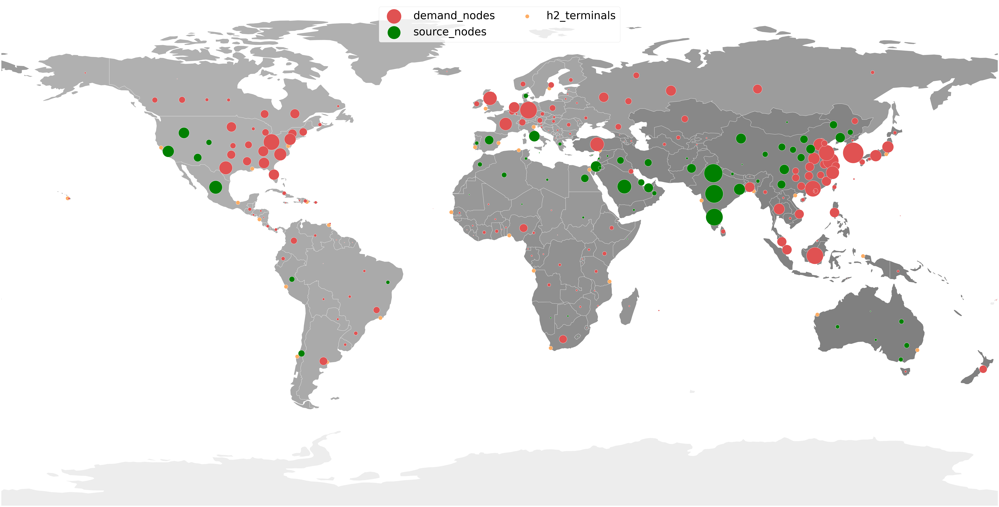

In [191]:
#How to insert bar charts into map diagrams
#code source: https://stackoverflow.com/questions/55854988/subplots-onto-a-basemap/55890475#55890475
#https://stackoverflow.com/questions/75825601/how-can-i-add-bar-charts-at-certain-locations-to-a-geopandas-map-using-the-same/75848560#75848560


#from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.pyplot as plt
import mpl_toolkits
import numpy as np
import matplotlib.patches as mpatches

base = world.plot(linewidth=0.5, color='#a8a8a8', edgecolor='white', figsize=(100,80), alpha=0.2)
north_america.plot(ax=base, color="#b0b0b0", markersize=5, edgecolor='white', alpha=1)
central_america.plot(ax=base, color='#aeaeae', markersize=5, edgecolor='white', alpha=1)
caribbean.plot(ax=base, color='#acacac', markersize=5, edgecolor='white', alpha=1)
east_coast_south_america.plot(ax=base, color='#aaaaaa', markersize=5, edgecolor='white', alpha=1)
west_coast_south_america.plot(ax=base, color='#a7a7a7', markersize=5, edgecolor='white', alpha=1)
northern_europe.plot(ax=base, color='#a5a5a5', markersize=5, edgecolor='white', alpha=1)
central_europe.plot(ax=base, color='#a3a3a3', markersize=5, edgecolor='white', alpha=1)
southern_europe.plot(ax=base, color='#a1a1a1', markersize=5, edgecolor='white', alpha=1)
eastern_europe.plot(ax=base, color='#9e9e9e', markersize=5, edgecolor='white', alpha=1)
russia_belarus.plot(ax=base, color='#9c9c9c', markersize=5, edgecolor='white', alpha=1)
northern_africa.plot(ax=base, color='#9a9a9a', markersize=5, edgecolor='white', alpha=1)
sahel_zone.plot(ax=base, color='#989898', markersize=5, edgecolor='white', alpha=1)
north_west_coast_africa.plot(ax=base, color='#959595', markersize=5, edgecolor='white', alpha=1)
east_coast_africa.plot(ax=base, color='#939393', markersize=5, edgecolor='white', alpha=1)
south_central_africa.plot(ax=base, color='#919191', markersize=5, edgecolor='white', alpha=1)
west_coast_africa.plot(ax=base, color='#8f8f8f', markersize=5, edgecolor='white', alpha=1)
southern_africa.plot(ax=base, color='#8d8d8d', markersize=5, edgecolor='white', alpha=1)
middle_east.plot(ax=base, color='#8a8a8a', markersize=5, edgecolor='white', alpha=1)
central_asia.plot(ax=base, color='#888888', markersize=5, edgecolor='white', alpha=1)
southern_asia.plot(ax=base, color='#868686', markersize=5, edgecolor='white', alpha=1)
eastern_asia.plot(ax=base, color='#848484', markersize=5, edgecolor='white', alpha=1)
south_eastern_asia.plot(ax=base, color='#828282', markersize=5, edgecolor='white', alpha=1)
australia_oceania.plot(ax=base, color='#808080', markersize=5, edgecolor='white', alpha=1)
node_results.plot(ax=base, color="#E05252", markersize=node_results["h2_demand_gross"]/15, alpha=1, edgecolors='white', label="demand_nodes", zorder=4) #demand overlay '#cd7565'
node_results_none.plot(ax=base, color='green', markersize=node_results_none["h2_demand_gross"]/15, alpha=1, edgecolors='white', label="source_nodes", zorder=5) #balance_type differentiation
h2_terminals.plot(ax=base, color='#fead64', markersize=500, alpha=1,edgecolors='white', label="h2_terminals", zorder=2)
plt.legend(loc="upper center", ncol=2, fontsize=60)
plt.ylim(-90,90)
plt.xlim(-180,180)

base.set_axis_off()

#über colorband machen? https://matplotlib.org/stable/tutorials/colors/colormaps.html